In [1]:
import pandas as pd                         #Data
import matplotlib.pyplot as plt             #Gráficas
import nltk                                 #Preprocesamiento
pd.options.display.max_columns = None
nltk.download('punkt')
from nltk.tokenize import word_tokenize     # Palabras
from nltk.probability import FreqDist       # Evaluación de frecuencia
from nltk.corpus import stopwords           # Palabras vacías
nltk.download('stopwords')
import warnings
warnings.filterwarnings('ignore')
import stanza
stanza.download(lang="es")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\MARIAFLOREZ\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MARIAFLOREZ\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


2022-03-21 19:18:03 INFO: Downloading default packages for language: es (Spanish)...
2022-03-21 19:18:04 INFO: File exists: C:\Users\MARIAFLOREZ\stanza_resources\es\default.zip.
2022-03-21 19:18:09 INFO: Finished downloading models and saved to C:\Users\MARIAFLOREZ\stanza_resources.


In [2]:
nlp = stanza.Pipeline("es")

2022-03-16 12:12:23 INFO: Loading these models for language: es (Spanish):
| Processor | Package |
-----------------------
| tokenize  | ancora  |
| mwt       | ancora  |
| pos       | ancora  |
| lemma     | ancora  |
| depparse  | ancora  |
| ner       | conll02 |

2022-03-16 12:12:23 INFO: Use device: cpu
2022-03-16 12:12:23 INFO: Loading: tokenize
2022-03-16 12:12:26 INFO: Loading: mwt
2022-03-16 12:12:26 INFO: Loading: pos
2022-03-16 12:12:26 INFO: Loading: lemma
2022-03-16 12:12:26 INFO: Loading: depparse
2022-03-16 12:12:27 INFO: Loading: ner
2022-03-16 12:12:28 INFO: Done loading processors!


### Cargar noticias

In [3]:
urls= ["https://www.mintic.gov.co/portal/inicio/Sala-de-prensa/Noticias/196198:Medio-millon-de-personas-se-formaron-en-temas-de-la-industria-creativa-digital-y-TI-en-los-cuatro-dias-de-Colombia-4-0",
        "https://www.vanguardia.com/economia/local/empresa-santandereana-en-la-cuarta-revolucion-industrial-JA1031685",
        "https://www.bucaramanga.gov.co/noticias/bucaramanga-educada-da-sus-primeros-pasos-en-la-meta-de-implementar-tecnologia-en-favor-del-progreso/",
        "https://www.elespectador.com/economia/caf-aprobo-prestamo-para-que-colombia-acelere-la-transformacion-digital-del-estado/",
        "https://www.semana.com/nacion/articulo/colombia-un-pais-que-se-acerca-a-la-industria-40/202105/",
        "https://www.mintic.gov.co/portal/inicio/Sala-de-prensa/Noticias/193498:MinTIC-abrio-las-inscripciones-para-la-segunda-jornada-de-Colombia-4-0-en-Norte-de-Santander",
        "https://www.bancolombia.com/negocios/actualizate/tendencias/industria-4-0-colombia",
        "https://www.semana.com/tecnologia/articulo/mujeres-en-el-sector-tecnologico-en-colombia-no-son-mas-del-30/202146/",
        "https://www.elnuevosiglo.com.co/articulos/07-09-2021-mas-apoyo-centros-de-transformacion-digital-empresarial",
        "https://mintic.gov.co/portal/inicio/Sala-de-prensa/184017:Cuarta-revolucion-industrial-la-oportunidad-para-cerrar-la-brecha-de-equidad-en-la-region",
        "https://minciencias.gov.co/sala_de_prensa/15-empresas-santander-reciben-apoyo-en-innovacion-para-mejorar-su-competitivdad",
        "https://redmas.com.co/w/alianza-de-claro-colombia-y-wellaware-para-ofrecer-soluciones-industriales-de-iot-e-industria-4.0?redirect=/inicio&color=#E80303&amp;seccion=Ciencia%20y%20Tecnolog%C3%ADa",
        "https://www.mintic.gov.co/portal/inicio/Sala-de-Prensa/Noticias/103951:Las-mujeres-conquistan-la-industria-digital-en-Colombia-4-0",
        "http://ingenieria.redmutis.org.co/es/actualidad/noticia/spin-off/",
        "https://www.laopinion.com.co/sectores-empresariales/transformacion-digital-clave-para-la-reactivacion",
        "https://www.funcionpublica.gov.co/-/-c2-a0el-pacto-por-la-transformaci-c3-b3n-digital-cambiar-c3-a1-la-vida-de-los-ciudadanos",
        "https://www.portafolio.co/innovacion/colombia-busca-ser-referente-en-nuevas-tecnologias-en-la-region-562734",
        "https://www.portafolio.co/innovacion/empresas-tienen-a-su-disposicion-una-generacion-de-cientificos-de-datos-562709",
        "https://www.laopinion.com.co/economia/cuales-son-las-habilidades-digitales-mas-demandadas-en-el-mercado-laboral",
        "https://www.portafolio.co/economia/empleo/habilidades-para-los-trabajadores-de-la-cuarta-revolucion-industrial-531301",
        "https://mintic.gov.co/portal/inicio/Sala-de-prensa/Noticias/82157:La-estrategia-Centros-de-Transformacion-Digital-Empresarial-llega-al-departamento-de-Santander",
        "https://www.rcnradio.com/economia/para-que-colombia-sea-competitiva-necesita-una-transformacion-digital-andi",
        "https://www.eltiempo.com/tecnosfera/novedades-tecnologia/colombia-lider-en-inteligencia-artificial-657344",
        "https://www.vanguardia.com/informes-comerciales/informacion-comercial/conozca-sobre-la-transformacion-digital-en-santander-LK4419629",
        "https://www.larepublica.co/economia/ministerio-tic-destino-1296-millones-a-20-empresas-de-la-industria-creativa-digital-3216429",
        "https://www.larepublica.co/analisis/fabiano-matos-3197360/mujeres-40-3299291",
        "https://minciencias.gov.co/sala_de_prensa/26-empresas-santander-forman-parte-del-programa-innovacion-colaborativa",
        "https://mintic.gov.co/portal/inicio/Sala-de-prensa/180720:Con-inversion-por-mas-de-123-638-millones-MinTIC-impulsa-apropiacion-digital-en-Santander",
        "https://www.larepublica.co/finanzas/en-colombia-90-de-los-bancos-acelero-su-transformacion-digital-en-pandemia-3231345",
        "https://www.colombiaproductiva.com/ptp-comunica/noticias/colombia-productiva-y-mincomercio-destinaran-4-000",
        "https://www.usergioarboleda.edu.co/noticias/mujeres-4-0-cuales-son-los-retos-del-liderazgo-femenino-en-las-organizaciones-de-la-cuarta-revolucion-industrial/",
        "https://es.investinbogota.org/noticias/coyuntura-esta-acelerando-la-adopcion-de-tecnologias-40-en-las-empresas",
        "https://www.portafolio.co/innovacion/colombia-centro-de-por-su-desarrollo-en-data-center-562406",
        "https://carrerasuniversitarias.com.co/fundacion-universitaria-del-area-andina/articulo-nuevas-tendencias-ingenieria-industrial-2022",
        "https://mintic.gov.co/portal/inicio/Sala-de-prensa/184215:Videojuegos-industrias-4-0-y-nuevos-medios-las-conversaciones-del-ultimo-dia-de-Colombia-4-0",
        "https://incp.org.co/mintic-apoyara-la-transformacion-digital-10-000-empresarios-territorio-nacional/",
        "https://mintic.gov.co/portal/inicio/Sala-de-prensa/Noticias/161807:Especializacion-4RI-un-programa-del-Ministerio-TIC-que-beneficio-a-440-empresas-en-2020",
        "https://www.portafolio.co/innovacion/colombia-4-0-la-fiesta-de-las-industrias-creativas-533940",
        "https://www.colombiaproductiva.com/ptp-comunica/noticias/con-sofistica-220-empresas-implementaron-tecnologi",
        "https://www.sena.edu.co/es-co/Noticias/Paginas/noticia.aspx?IdNoticia=4454",
        "https://www.intersoftware.org.co/cl%C3%BAster40",
        "https://www.portafolio.co/contenido-patrocinado/centros-de-datos-a-la-vanguardia-de-la-transformacion-digital-558864",
        "https://www.semana.com/contenidos-editoriales/especiales-regionales/articulo/la-ruta-de-la-transformacion-digital-en-colombia/202049/",
        "https://www.laopinion.com.co/economia/industrias-40-ganan-espacio-en-la-region",
        "https://www.co.undp.org/content/colombia/es/home/presscenter/articles/2019/02/_la-cuarta-revolucion-industrial-podra-beneficiar-a-todos-si-hay.html",
        "https://innpulsacolombia.com/innformate/33-empresas-colombianas-empiezan-su-camino-hacia-la-cuarta-revolucion-industrial",
        "https://www.eltiempo.com/contenido-comercial/microsoft-ha-capacitado-a-medio-millon-de-colombianos-654395",
        "https://www.amb.gov.co/smart-city-forum-2019-genero-una-gran-sinergia-que-impulsara-al-area-metropolitana-de-bucaramanga-como-el-territorio-fertil-para-la-innovacion-y-el-desarrollo/",
        "https://www.bloomberglinea.com/2021/11/22/colombia-aplaza-subasta-de-5g-y-el-tiempo-empieza-a-jugarle-en-contra/",
        "https://www.bancolombia.com/wps/portal/negocios/actualizate/tendencias/asi-evoluciona-la-produccion-con-economia-4-0”"
      ]


In [4]:
#Función abrir noticias
def apertura_notis(notis):
    lista_notis = []
    for d in notis:
        f = open(d, encoding="utf8")
        raw = f.read()
        lista_notis.append(raw)
    return(lista_notis)

In [5]:
noticia = ["noti1.txt","noti2.txt","noti3.txt","noti4.txt","noti5.txt","noti6.txt","noti7.txt","noti8.txt","noti9.txt","noti10.txt","noti11.txt","noti12.txt","noti13.txt","noti14.txt","noti15.txt","noti16.txt","noti17.txt","noti18.txt","noti19.txt","noti20.txt","noti21.txt","noti22.txt","noti23.txt","noti24.txt","noti25.txt","noti26.txt","noti27.txt","noti28.txt","noti29.txt","noti30.txt","noti31.txt","noti32.txt","noti33.txt","noti34.txt","noti35.txt","noti36.txt","noti37.txt","noti38.txt","noti39.txt","noti40.txt","noti41.txt","noti42.txt","noti43.txt","noti44.txt","noti45.txt","noti46.txt","noti47.txt","noti48.txt","noti49.txt","noti50.txt"]

noticias = apertura_notis(noticia)

In [6]:
noticias

['Bajo el liderazgo del Ministerio de Ciencia, Tecnología e Innovación, en alianza con la Cámara de Comercio de Bucaramanga se llevó a cabo el cierre de la IV cohorte del programa Sistemas de Innovación Empresarial donde 15 organizaciones santandereanas, después de enfrentar el covid-19, desarrollaron capacidades en: estrategia de innovación, compromiso y liderazgo, gestión del portafolio de innovación y ecosistema de innovación.<br />\n<br />\nGracias a su esfuerzo y dedicación, los beneficiarios lograron superar una serie de barreras y poner en marcha sus <strong>Sistemas de Innovación Empresarial</strong> para aumentar su competitividad. En total, se desarrollaron 23 iniciativas, se generaron 18 nuevos empleos principalmente en sectores industriales de manufactura, servicios y comercial; asimismo, en los subsectores industriales de salud, alimentación y metalmecánico. De igual forma, se llevaron a cabo 59 colaboraciones efectivas con actores del ecosistema de innovación.<br />\n<br 

### Preprocesamiento de datos

In [7]:
#eliminar tildes

def tildes(s):
    replacements = (
        ("á", "a"),
        ("é", "e"),
        ("í", "i"),
        ("ó", "o"),
        ("ú", "u"),
    )
    for a, b in replacements:
        s = s.replace(a, b).replace(a.upper(), b.upper())
    return s

tilde = []
for txt in noticias:
    palabras = txt.lower() #Minúsculas
    tilde.append(tildes(palabras))
tilde

['bajo el liderazgo del ministerio de ciencia, tecnologia e innovacion, en alianza con la camara de comercio de bucaramanga se llevo a cabo el cierre de la iv cohorte del programa sistemas de innovacion empresarial donde 15 organizaciones santandereanas, despues de enfrentar el covid-19, desarrollaron capacidades en: estrategia de innovacion, compromiso y liderazgo, gestion del portafolio de innovacion y ecosistema de innovacion.<br />\n<br />\ngracias a su esfuerzo y dedicacion, los beneficiarios lograron superar una serie de barreras y poner en marcha sus <strong>sistemas de innovacion empresarial</strong> para aumentar su competitividad. en total, se desarrollaron 23 iniciativas, se generaron 18 nuevos empleos principalmente en sectores industriales de manufactura, servicios y comercial; asimismo, en los subsectores industriales de salud, alimentacion y metalmecanico. de igual forma, se llevaron a cabo 59 colaboraciones efectivas con actores del ecosistema de innovacion.<br />\n<br 

In [8]:
#Eliminar Saltos de línea

noticias = [i.replace("\n", " ") for i in tilde]

noticias

['bajo el liderazgo del ministerio de ciencia, tecnologia e innovacion, en alianza con la camara de comercio de bucaramanga se llevo a cabo el cierre de la iv cohorte del programa sistemas de innovacion empresarial donde 15 organizaciones santandereanas, despues de enfrentar el covid-19, desarrollaron capacidades en: estrategia de innovacion, compromiso y liderazgo, gestion del portafolio de innovacion y ecosistema de innovacion.<br /> <br /> gracias a su esfuerzo y dedicacion, los beneficiarios lograron superar una serie de barreras y poner en marcha sus <strong>sistemas de innovacion empresarial</strong> para aumentar su competitividad. en total, se desarrollaron 23 iniciativas, se generaron 18 nuevos empleos principalmente en sectores industriales de manufactura, servicios y comercial; asimismo, en los subsectores industriales de salud, alimentacion y metalmecanico. de igual forma, se llevaron a cabo 59 colaboraciones efectivas con actores del ecosistema de innovacion.<br /> <br /> 

In [9]:
#Eliminar números

newstring = []
for documento in noticias:
    x = "".join([i for i in str(documento) if not i.isdigit()])
    newstring.append(x)


In [10]:
#Eliminar caracteres especiales
import re
patron = "[\W]+"
regex = re.compile(patron)

result = []
for documento in newstring:
    resultado = regex.sub(' ', documento)
    result.append(resultado)
    
result


['bajo el liderazgo del ministerio de ciencia tecnologia e innovacion en alianza con la camara de comercio de bucaramanga se llevo a cabo el cierre de la iv cohorte del programa sistemas de innovacion empresarial donde organizaciones santandereanas despues de enfrentar el covid desarrollaron capacidades en estrategia de innovacion compromiso y liderazgo gestion del portafolio de innovacion y ecosistema de innovacion br br gracias a su esfuerzo y dedicacion los beneficiarios lograron superar una serie de barreras y poner en marcha sus strong sistemas de innovacion empresarial strong para aumentar su competitividad en total se desarrollaron iniciativas se generaron nuevos empleos principalmente en sectores industriales de manufactura servicios y comercial asimismo en los subsectores industriales de salud alimentacion y metalmecanico de igual forma se llevaron a cabo colaboraciones efectivas con actores del ecosistema de innovacion br br durante el evento de cierre del programa strong sis

In [11]:
clean_text = []
for text in result:
    clean_text.append(text.replace('_', ''))
clean_text

['bajo el liderazgo del ministerio de ciencia tecnologia e innovacion en alianza con la camara de comercio de bucaramanga se llevo a cabo el cierre de la iv cohorte del programa sistemas de innovacion empresarial donde organizaciones santandereanas despues de enfrentar el covid desarrollaron capacidades en estrategia de innovacion compromiso y liderazgo gestion del portafolio de innovacion y ecosistema de innovacion br br gracias a su esfuerzo y dedicacion los beneficiarios lograron superar una serie de barreras y poner en marcha sus strong sistemas de innovacion empresarial strong para aumentar su competitividad en total se desarrollaron iniciativas se generaron nuevos empleos principalmente en sectores industriales de manufactura servicios y comercial asimismo en los subsectores industriales de salud alimentacion y metalmecanico de igual forma se llevaron a cabo colaboraciones efectivas con actores del ecosistema de innovacion br br durante el evento de cierre del programa strong sis

In [13]:
# orden lista por Menor a mayor longitud (ascendente):

result_ord = sorted(clean_text, key=len)
print(result_ord)

['este año en su undecima version el evento de contenidos digitales e industria ti mas importante de america latina colombia recibio a mas de medio millon de personas en sus modalidades virtual y presencial p p el ministerio de tecnologias de la informacion y las comunicaciones mintic informo que en los tres dias de barranquilla atlantico y uno en ocaña norte de santander un total de personas se conectaron por medio de la plataforma a href https col co https col co a estuvieron presencialmente siguieron la transmision en nueve canales regionales y se lograron mas de visualizaciones en redes sociales p p em cerramos la undecima edicion de colombia con un gran impacto con espacios como estos fomentamos el crecimiento de las industrias creativas digitales y ti de las empresas ademas contribuimos no solo a la reactivacion economica sino al desarrollo de los colombianos que le apuestan a la tecnologia para encontrar nuevas oportunidades laborales con el fin de mejorar su nivel de vida y el 

In [14]:
for txt in result_ord:
    print(len(txt))
    

1718
1860
1910
1952
2143
2153
2320
2439
2534
2626
2680
2948
2998
3028
3044
3098
3190
3287
3310
3414
3471
3474
3545
3587
3670
3670
3750
3888
4034
4035
4762
4872
4905
4958
5050
5420
5640
5852
6084
6233
6626
6651
6759
7501
8216
8813
8953
10904
12737
27580


In [15]:
#Lemmatización bloque cero
lemas_0 = {}
for i in range(0,36):
    notic_0 = nlp(result_ord[i])
    for sent in notic_0.sentences:
        for word in sent.words:
            if i not in lemas_0:
                lemas_0[i]=[]
                lemas_0[i].append(word.lemma)
            else:
                lemas_0[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: este 	lemma: este
word: año 	lemma: año
word: en 	lemma: en
word: su 	lemma: su
word: undecima 	lemma: undecimo
word: version 	lemma: version
word: el 	lemma: el
word: evento 	lemma: evento
word: de 	lemma: de
word: contenidos 	lemma: contenido
word: digitales 	lemma: digital
word: e 	lemma: e
word: industria 	lemma: industria
word: ti 	lemma: tú
word: mas 	lemma: mas
word: importante 	lemma: importante
word: de 	lemma: de
word: america 	lemma: america
word: latina 	lemma: latino
word: colombia 	lemma: colombio
word: recibio 	lemma: recibir
word: a 	lemma: a
word: mas 	lemma: mas
word: de 	lemma: de
word: medio 	lemma: medio
word: millon 	lemma: millon
word: de 	lemma: de
word: personas 	lemma: persona
word: en 	lemma: en
word: sus 	lemma: su
word: modalidades 	lemma: modalidad
word: virtual 	lemma: virtual
word: y 	lemma: y
word: presencial 	lemma: presencial
word: p 	lemma: p
word: p 	lemma: p
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: tec

word: p 	lemma: p
word: desde 	lemma: desde
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: municipal 	lemma: municipal
word: se 	lemma: él
word: avanza 	lemma: avanzar
word: para 	lemma: para
word: cumplir 	lemma: cumplir
word: con 	lemma: con
word: la 	lemma: el
word: propuesta 	lemma: propuesta
word: que 	lemma: que
word: esta 	lemma: este
word: inscrita 	lemma: inscrita
word: en 	lemma: en
word: el 	lemma: el
word: plan 	lemma: plan
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: el 	lemma: el
word: programa 	lemma: programa
word: em 	lemma: em
word: bucaramanga 	lemma: bucaramango
word: progresa 	lemma: progresar
word: em 	lemma: em
word: con 	lemma: con
word: el 	lemma: el
word: que 	lemma: que
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: local 	lemma: local
word: busca 	lemma: buscar
word: llegar 	lemma: llegar
word: a 	lemma: a
word: mil 	lemma: mil
word: personas 	lemma: persona
word: con 	lemma: con
word: una 	lemma: un

word: i 	lemma: i
word: tenemos 	lemma: tener
word: un 	lemma: uno
word: camino 	lemma: camino
word: largo 	lemma: largo
word: que 	lemma: que
word: recorrer 	lemma: recorrer
word: pero 	lemma: pero
word: vamos 	lemma: ir
word: por 	lemma: por
word: buen 	lemma: buen
word: camino 	lemma: camino
word: i 	lemma: i
word: con 	lemma: con
word: esta 	lemma: este
word: frase 	lemma: frase
word: reinaldo 	lemma: reinaldo
word: garcia 	lemma: garcia
word: presidente 	lemma: presidente
word: de 	lemma: de
word: siemens 	lemma: siemens
word: colombia 	lemma: colombio
word: inicio 	lemma: inicio
word: el 	lemma: el
word: foro 	lemma: foro
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: no 	lemma: no
word: obstante 	lemma: obstante
word: resalto 	lemma: resaltar
word: que 	lemma: que
word: b 	lemma: b
word: para 	lemma: para
word: adoptar 	lemma: adoptar
word: las 	lemma: el
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 

word: despues 	lemma: despue
word: de 	lemma: de
word: una 	lemma: uno
word: exitosa 	lemma: exitoso
word: jornada 	lemma: jornada
word: en 	lemma: en
word: el 	lemma: el
word: atlantico 	lemma: atlantico
word: con 	lemma: con
word: mas 	lemma: mas
word: de 	lemma: de
word: personas 	lemma: persona
word: conectadas 	lemma: conectado
word: de 	lemma: de
word: forma 	lemma: forma
word: virtual 	lemma: virtual
word: y 	lemma: y
word: asistentes 	lemma: asistente
word: presenciales 	lemma: presencial
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: las 	lemma: el
word: tic 	lemma: tic
word: abrio 	lemma: abrio
word: las 	lemma: el
word: inscripciones 	lemma: inscripción
word: para 	lemma: para
word: la 	lemma: el
word: segunda 	lemma: segundo
word: jornada 	lemma: jornada
word: de 	lemma: de
word: colombia 	lemma: colombia
word: que 	lemma: que
word: se 	lemma: él
word: realizara 	lemma: realizar
word: en 	lemma: en
word: ocaña 	lemma: ocaña
word: norte 	le

word: hablar 	lemma: hablar
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: es 	lemma: ser
word: hablar 	lemma: hablar
word: de 	lemma: de
word: digitalizacion 	lemma: digitalizacion
word: strong 	lemma: strong
word: e 	lemma: e
word: intercomunicacion 	lemma: intercomunicacion
word: de 	lemma: de
word: las 	lemma: el
word: cosas 	lemma: cosa
word: personas 	lemma: persona
word: y 	lemma: y
word: equipos 	lemma: equipo
word: para 	lemma: para
word: convertir 	lemma: convertir
word: las 	lemma: el
word: organizaciones 	lemma: organización
word: o 	lemma: o
word: comunidades 	lemma: comunidad
word: en 	lemma: en
word: entornos 	lemma: entorno
word: inteligentes 	lemma: inteligente
word: e 	lemma: e
word: interconectados 	lemma: interconectado
word: aqui 	lemma: aqui
word: el 	lemma: el
word: internet 	lemma: internet
word: de 	lemma: de
word: las 	lemma: el
word: cosas 	lemma: cosa
word: y 	lemma: y
word: la 	lemma: el
word: inteligencia 	lemma: inteligenc

word: sp 	lemma: sp
word: el 	lemma: el
word: mas 	lemma: mas
word: reciente 	lemma: reciente
word: estudio 	lemma: estudio
word: de 	lemma: de
word: compañia 	lemma: compañia
word: especializada 	lemma: especializado
word: en 	lemma: en
word: educacion 	lemma: educacion
word: tecnologica 	lemma: tecnologico
word: crack 	lemma: crack
word: the 	lemma: the
word: code 	lemma: code
word: revelo 	lemma: revelar
word: que 	lemma: que
word: solo 	lemma: solo
word: el 	lemma: el
word: de 	lemma: de
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: se 	lemma: él
word: desempeñan 	lemma: desempeñar
word: en 	lemma: en
word: el 	lemma: el
word: sector 	lemma: sector
word: tecnologico 	lemma: tecnologico
word: en 	lemma: en
word: colombia 	lemma: colombia
word: p 	lemma: p
word: p 	lemma: p
word: class 	lemma: class
word: section 	lemma: section
word: sp 	lemma: sp
word: ademas 	lemma: adema
word: solo 	lemma: solo
word: dos 	lemma: dos
word: de 	lemma: de
word: cada 	lemma: cada
word: diez 

word: la 	lemma: el
word: tenencia 	lemma: tenencia
word: y 	lemma: y
word: el 	lemma: el
word: uso 	lemma: uso
word: estrategico 	lemma: estrategico
word: de 	lemma: de
word: las 	lemma: el
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: informacion 	lemma: informacion
word: han 	lemma: haber
word: sido 	lemma: ser
word: identificados 	lemma: identificar
word: como 	lemma: como
word: factores 	lemma: factor
word: clave 	lemma: clave
word: para 	lemma: para
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: la 	lemma: el
word: competitividad 	lemma: competitividad
word: y 	lemma: y
word: la 	lemma: el
word: reactivacion 	lemma: reactivacion
word: de 	lemma: de
word: la 	lemma: el
word: economia 	lemma: economia
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: por 	lemma: por
word: eso 	lemma: ese
word: y 	lemma: y
word: con 	lemma: con
word: el 	lemma: el
word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: garantizar 	lemma: 

word: p 	lemma: p
word: asumir 	lemma: asumir
word: rapidamente 	lemma: rapidamente
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: empresarial 	lemma: empresarial
word: como 	lemma: como
word: un 	lemma: uno
word: requisito 	lemma: requisito
word: indispensable 	lemma: indispensable
word: para 	lemma: para
word: no 	lemma: no
word: desaparecer 	lemma: desaparecer
word: en 	lemma: en
word: un 	lemma: uno
word: mundo 	lemma: mundo
word: cuya 	lemma: cuyo
word: economia 	lemma: economia
word: se 	lemma: él
word: sustenta 	lemma: sustentar
word: en 	lemma: en
word: el 	lemma: el
word: avance 	lemma: avance
word: tecnologico 	lemma: tecnologico
word: fue 	lemma: ser
word: el 	lemma: el
word: concepto 	lemma: concepto
word: expuesto 	lemma: expuesto
word: por 	lemma: por
word: diego 	lemma: diego
word: tovar 	lemma: tovar
word: expositor 	lemma: expositor
word: de 	lemma: de
word: el 	lemma: el
word: track 	lemma: track
word: de 	lemma: de

word: bajo 	lemma: bajo
word: el 	lemma: el
word: liderazgo 	lemma: liderazgo
word: de 	lemma: de
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: ciencia 	lemma: ciencia
word: tecnologia 	lemma: tecnologia
word: e 	lemma: e
word: innovacion 	lemma: innovacion
word: en 	lemma: en
word: alianza 	lemma: alianza
word: con 	lemma: con
word: la 	lemma: el
word: camara 	lemma: camara
word: de 	lemma: de
word: comercio 	lemma: comercio
word: de 	lemma: de
word: bucaramanga 	lemma: bucaramanga
word: se 	lemma: él
word: llevo 	lemma: llevar
word: a 	lemma: a
word: cabo 	lemma: cabo
word: el 	lemma: el
word: cierre 	lemma: cierre
word: de 	lemma: de
word: la 	lemma: el
word: iv 	lemma: iv
word: cohorte 	lemma: cohorte
word: de 	lemma: de
word: el 	lemma: el
word: programa 	lemma: programa
word: sistemas 	lemma: sistema
word: de 	lemma: de
word: innovacion 	lemma: innovacion
word: empresarial 	lemma: empresarial
word: donde 	lemma: donde
word: organizaciones 	lemm

word: claro 	lemma: claro
word: enriquece 	lemma: enriquecer
word: su 	lemma: su
word: portafolio 	lemma: portafolio
word: de 	lemma: de
word: servicios 	lemma: servicio
word: de 	lemma: de
word: consultoria 	lemma: consultoria
word: a 	lemma: a
word: el 	lemma: el
word: permitir 	lemma: permitir
word: la 	lemma: el
word: personalizacion 	lemma: personalizacion
word: y 	lemma: y
word: monitoreo 	lemma: monitoreo
word: de 	lemma: de
word: equipos 	lemma: equipo
word: industriales 	lemma: industrial
word: a 	lemma: a
word: la 	lemma: el
word: medida 	lemma: medida
word: segun 	lemma: segun
word: los 	lemma: el
word: requerimientos 	lemma: requerimiento
word: de 	lemma: de
word: sectores 	lemma: sector
word: de 	lemma: de
word: manufactura 	lemma: manufactura
word: industrial 	lemma: industrial
word: energia 	lemma: energia
word: oil 	lemma: oil
word: amp 	lemma: amp
word: gas 	lemma: gas
word: servicios 	lemma: servicio
word: publicos 	lemma: publico
word: o 	lemma: o
word: salud 	lemma:

word: en 	lemma: en
word: los 	lemma: el
word: ultimos 	lemma: ultimo
word: años 	lemma: año
word: nbsp 	lemma: nbsp
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: se 	lemma: él
word: han 	lemma: haber
word: empoderado 	lemma: empoderar
word: cada 	lemma: cada
word: vez 	lemma: vez
word: mas 	lemma: mas
word: de 	lemma: de
word: las 	lemma: el
word: industrias 	lemma: industria
word: creativas 	lemma: creativo
word: digitales 	lemma: digital
word: en 	lemma: en
word: el 	lemma: el
word: mundo 	lemma: mundo
word: es 	lemma: ser
word: por 	lemma: por
word: eso 	lemma: ese
word: que 	lemma: que
word: esta 	lemma: este
word: vez 	lemma: vez
word: colombia 	lemma: colombio
word: el 	lemma: el
word: encuentro 	lemma: encuentro
word: digital 	lemma: digital
word: y 	lemma: y
word: de 	lemma: de
word: economia 	lemma: economia
word: naranja 	lemma: naranjo
word: mas 	lemma: mas
word: importante 	lemma: importante
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: ser

word: tras 	lemma: tras
word: una 	lemma: uno
word: visita 	lemma: visita
word: de 	lemma: de
word: verificacion 	lemma: verificacion
word: en 	lemma: en
word: las 	lemma: el
word: instalaciones 	lemma: instalación
word: de 	lemma: de
word: el 	lemma: el
word: centro 	lemma: centro
word: de 	lemma: de
word: internet 	lemma: internet
word: de 	lemma: de
word: las 	lemma: el
word: cosas 	lemma: cosa
word: de 	lemma: de
word: la 	lemma: el
word: universidad 	lemma: universidad
word: autonoma 	lemma: autonomo
word: de 	lemma: de
word: bucaramanga 	lemma: bucaramanga
word: se 	lemma: él
word: confirmo 	lemma: confirmar
word: por 	lemma: por
word: parte 	lemma: parte
word: de 	lemma: de
word: colciencias 	lemma: colciencia
word: y 	lemma: y
word: tecnova 	lemma: tecnover
word: la 	lemma: el
word: aprobacion 	lemma: aprobacion
word: de 	lemma: de
word: este 	lemma: este
word: centro 	lemma: centro
word: como 	lemma: como
word: una 	lemma: uno
word: de 	lemma: de
word: las 	lemma: el
word: ini

word: rong 	lemma: rong
word: lograr 	lemma: lograr
word: la 	lemma: el
word: inmersion 	lemma: inmersion
word: de 	lemma: de
word: las 	lemma: el
word: tecnologias 	lemma: tecnologia
word: digitales 	lemma: digital
word: en 	lemma: en
word: cada 	lemma: cada
word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: procesos 	lemma: proceso
word: que 	lemma: que
word: se 	lemma: él
word: desarrollan 	lemma: desarrollar
word: para 	lemma: para
word: la 	lemma: el
word: reactivacion 	lemma: reactivacion
word: economica 	lemma: economico
word: es 	lemma: ser
word: el 	lemma: el
word: proposito 	lemma: proposito
word: de 	lemma: de
word: los 	lemma: el
word: programas 	lemma: programa
word: que 	lemma: que
word: se 	lemma: él
word: vienen 	lemma: venir
word: desarrollando 	lemma: desarrollar
word: desde 	lemma: desde
word: el 	lemma: el
word: viceministerio 	lemma: viceministerio
word: de 	lemma: de
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: 

word: strong 	lemma: strong
word: el 	lemma: el
word: departamento 	lemma: departamento
word: administrativo 	lemma: administrativo
word: de 	lemma: de
word: la 	lemma: el
word: funcion 	lemma: funcion
word: publica 	lemma: publicar
word: adelanto 	lemma: adelanto
word: este 	lemma: este
word: martes 	lemma: martes
word: el 	lemma: el
word: encuentro 	lemma: encuentro
word: transversal 	lemma: transversal
word: de 	lemma: de
word: jefes 	lemma: jefe
word: de 	lemma: de
word: tecnologia 	lemma: tecnologia
word: con 	lemma: con
word: el 	lemma: el
word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: evaluar 	lemma: evaluar
word: los 	lemma: el
word: avances 	lemma: avance
word: de 	lemma: de
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: y 	lemma: y
word: modernizacion 	lemma: modernizacion
word: de 	lemma: de
word: las 	lemma: el
word: entidades 	lemma: entidad
word: publicas 	lemma: publico
word: p 	lemma: p
word: p 	lemma: p
word: nbsp 	lemma: nbsp
word: p 

word: durante 	lemma: durante
word: el 	lemma: el
word: evento 	lemma: evento
word: presente 	lemma: presente
word: y 	lemma: y
word: futuro 	lemma: futuro
word: de 	lemma: de
word: la 	lemma: el
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: ia 	lemma: ir
word: en 	lemma: en
word: la 	lemma: el
word: region 	lemma: region
word: la 	lemma: el
word: organizacion 	lemma: organizacion
word: de 	lemma: de
word: las 	lemma: el
word: naciones 	lemma: nación
word: unidas 	lemma: unido
word: para 	lemma: para
word: la 	lemma: el
word: educacion 	lemma: educacion
word: la 	lemma: el
word: ciencia 	lemma: ciencia
word: y 	lemma: y
word: la 	lemma: el
word: cultura 	lemma: cultura
word: unesco 	lemma: unesco
word: destaco 	lemma: destacar
word: a 	lemma: a
word: b 	lemma: b
word: colombia 	lemma: colombio
word: como 	lemma: como
word: lider 	lemma: lider
word: en 	lemma: en
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word:

word: la 	lemma: el
word: pandemia 	lemma: pandemia
word: por 	lemma: por
word: el 	lemma: el
word: covid 	lemma: covid
word: las 	lemma: el
word: empresas 	lemma: empresa
word: colombianas 	lemma: colombiano
word: son 	lemma: ser
word: mas 	lemma: mas
word: conscientes 	lemma: consciente
word: de 	lemma: de
word: el 	lemma: el
word: b 	lemma: b
word: uso 	lemma: uso
word: de 	lemma: de
word: la 	lemma: el
word: analitica 	lemma: analitica
word: y 	lemma: y
word: de 	lemma: de
word: la 	lemma: el
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: b 	lemma: b
word: en 	lemma: en
word: sus 	lemma: su
word: modelos 	lemma: modelo
word: productivos 	lemma: productivo
word: de 	lemma: de
word: gestion 	lemma: gestion
word: de 	lemma: de
word: riesgos 	lemma: riesgo
word: y 	lemma: y
word: de 	lemma: de
word: campañas 	lemma: campaña
word: de 	lemma: de
word: marketing 	lemma: marketing
word: entre 	lemma: entre
word: otros 	lemma: otro
word: procesos 	lemma: p

word: la 	lemma: el
word: pandemia 	lemma: pandemia
word: de 	lemma: de
word: covid 	lemma: covid
word: llevo 	lemma: llevar
word: a 	lemma: a
word: que 	lemma: que
word: diferentes 	lemma: diferente
word: sectores 	lemma: sector
word: agilizaran 	lemma: agilizar
word: sus 	lemma: su
word: procesos 	lemma: proceso
word: de 	lemma: de
word: automatizacion 	lemma: automatizacion
word: y 	lemma: y
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: strong 	lemma: strong
word: de 	lemma: de
word: acuerdo 	lemma: acuerdo
word: con 	lemma: con
word: el 	lemma: el
word: informe 	lemma: informe
word: sobre 	lemma: sobre
word: el 	lemma: el
word: futuro 	lemma: futuro
word: de 	lemma: de
word: el 	lemma: el
word: empleo 	lemma: empleo
word: de 	lemma: de
word: world 	lemma: world
word: economic 	lemma: economic
word: forum 	lemma: forum
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: tecnologica 	lemma: tecnologico
word: por 	lemma: por
word: parte 	lemma: 

word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: y 	lemma: y
word: con 	lemma: con
word: ella 	lemma: él
word: una 	lemma: uno
word: realidad 	lemma: realidad
word: las 	lemma: el
word: habilidades 	lemma: habilidad
word: que 	lemma: que
word: requieren 	lemma: requerir
word: las 	lemma: el
word: industrias 	lemma: industria
word: son 	lemma: ser
word: diferentes 	lemma: diferente
word: y 	lemma: y
word: estan 	lemma: estar
word: cambiando 	lemma: cambiar
word: constantemente 	lemma: constantemente
word: b 	lemma: b
word: por 	lemma: por
word: ello 	lemma: él
word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: grandes 	lemma: grande
word: retos 	lemma: reto
word: de 	lemma: de
word: la 	lemma: el
word: actualidad 	lemma: actualidad
word: es 	lemma: ser
word: formar 	lemma: formar
word: a 	lemma: a
word: las 	lemma: el
word: personas 	lemma: persona
word: en 	lemma: en
word: competencias 	lemma

word: cid 	lemma: cid
word: con 	lemma: con
word: el 	lemma: el
word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: fortalecer 	lemma: fortalecer
word: el 	lemma: el
word: tejido 	lemma: tejido
word: empresarial 	lemma: empresarial
word: de 	lemma: de
word: la 	lemma: el
word: region 	lemma: region
word: y 	lemma: y
word: contribuir 	lemma: contribuir
word: con 	lemma: con
word: la 	lemma: el
word: reactivacion 	lemma: reactivacion
word: economica 	lemma: economico
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: nacional 	lemma: nacional
word: entrego 	lemma: entregar
word: el 	lemma: el
word: centro 	lemma: centro
word: de 	lemma: de
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: empresarial 	lemma: empresarial
word: en 	lemma: en
word: la 	lemma: el
word: ciudad 	lemma: ciudad
word: de 	lemma: de
word: bucaramanga 	lemma: bucaramanga
word: h 	lemma: h
word: div 	lemma: div

word: l 	lemma: l
word: presidente 	lemma: presidente
word: de 	lemma: de
word: la 	lemma: el
word: asociacion 	lemma: asociacion
word: nacional 	lemma: nacional
word: de 	lemma: de
word: empresarios 	lemma: empresario
word: de 	lemma: de
word: colombia 	lemma: colombia
word: andi 	lemma: andi
word: bruce 	lemma: bruce
word: mac 	lemma: mac
word: master 	lemma: master
word: señalo 	lemma: señalar
word: que 	lemma: que
word: para 	lemma: para
word: que 	lemma: que
word: colombia 	lemma: colombia
word: sea 	lemma: ser
word: un 	lemma: uno
word: ecosistema 	lemma: ecosistema
word: competitivo 	lemma: competitivo
word: se 	lemma: él
word: debe 	lemma: deber
word: strong 	lemma: strong
word: aumentar 	lemma: aumentar
word: la 	lemma: el
word: inversion 	lemma: inversion
word: en 	lemma: en
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: y 	lemma: y
word: tecnologia 	lemma: tecnologia
word: strong 	lemma: strong
word: p 	lemma: p
word: p 	lemma: p
word: lang 	

word: gabriela 	lemma: gabriela
word: ramos 	lemma: ramo
word: directora 	lemma: director
word: general 	lemma: general
word: adjunta 	lemma: adjunto
word: de 	lemma: de
word: unesco 	lemma: unesco
word: para 	lemma: para
word: ciencias 	lemma: ciencia
word: sociales 	lemma: social
word: y 	lemma: y
word: humanas 	lemma: humano
word: explico 	lemma: explicar
word: en 	lemma: en
word: el 	lemma: el
word: evento 	lemma: evento
word: presente 	lemma: presente
word: y 	lemma: y
word: futuro 	lemma: futuro
word: de 	lemma: de
word: la 	lemma: el
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: ia 	lemma: ia
word: en 	lemma: en
word: la 	lemma: el
word: region 	lemma: region
word: que 	lemma: que
word: hay 	lemma: haber
word: varios 	lemma: varios
word: motivos 	lemma: motivo
word: por 	lemma: por
word: los 	lemma: el
word: que 	lemma: que
word: el 	lemma: el
word: pais 	lemma: pais
word: se 	lemma: él
word: lleva 	lemma: llevar
word: el 	lemma: el
word: reco

word: p 	lemma: p
word: un 	lemma: uno
word: analisis 	lemma: analisis
word: de 	lemma: de
word: el 	lemma: el
word: futuro 	lemma: futuro
word: de 	lemma: de
word: santander 	lemma: santander
word: desde 	lemma: desde
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: de 	lemma: de
word: sus 	lemma: su
word: sectores 	lemma: sector
word: economicos 	lemma: economico
word: es 	lemma: ser
word: el 	lemma: el
word: primer 	lemma: primero
word: tema 	lemma: tema
word: que 	lemma: que
word: abordara 	lemma: abordar
word: el 	lemma: el
word: ciclo 	lemma: ciclo
word: de 	lemma: de
word: foros 	lemma: foro
word: sectoriales 	lemma: sectorial
word: que 	lemma: que
word: lidera 	lemma: liderar
word: vanguardia 	lemma: vanguardia
word: sobre 	lemma: sobre
word: el 	lemma: el
word: ecosistema 	lemma: ecosistema
word: digital 	lemma: digital
word: p 	lemma: p
word: p 	lemma: p
word: i 	lemma: i
word: b 	lemma: b
word: conoce 	lemma: conocer
word: l

word: un 	lemma: uno
word: nuevo 	lemma: nuevo
word: impulso 	lemma: impulso
word: economico 	lemma: economico
word: recibio 	lemma: recibir
word: el 	lemma: el
word: sector 	lemma: sector
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: creativa 	lemma: creativo
word: digital 	lemma: digital
word: y 	lemma: y
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: ti 	lemma: tú
word: con 	lemma: con
word: la 	lemma: el
word: entrega 	lemma: entrega
word: de 	lemma: de
word: millones 	lemma: millón
word: por 	lemma: por
word: parte 	lemma: parte
word: de 	lemma: de
word: karen 	lemma: karen
word: abudinen 	lemma: abudinen
word: ministra 	lemma: ministra
word: de 	lemma: de
word: las 	lemma: el
word: tic 	lemma: tic
word: a 	lemma: a
word: las 	lemma: el
word: empresas 	lemma: empresa
word: ganadoras 	lemma: ganador
word: de 	lemma: de
word: la 	lemma: el
word: convocatoria 	lemma: convocator

word: p 	lemma: p
word: el 	lemma: el
word: lugar 	lemma: lugar
word: de 	lemma: de
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: siempre 	lemma: siempre
word: ha 	lemma: haber
word: sido 	lemma: ser
word: en 	lemma: en
word: la 	lemma: el
word: ciencia 	lemma: ciencia
word: y 	lemma: y
word: la 	lemma: el
word: tecnologia 	lemma: tecnologia
word: fue 	lemma: ser
word: una 	lemma: uno
word: mujer 	lemma: mujer
word: augusta 	lemma: augusta
word: ada 	lemma: ada
word: king 	lemma: king
word: quien 	lemma: quien
word: creo 	lemma: creer
word: el 	lemma: el
word: primer 	lemma: primero
word: programa 	lemma: programa
word: informatico 	lemma: informatico
word: fue 	lemma: ser
word: una 	lemma: uno
word: mujer 	lemma: mujer
word: margaret 	lemma: margaret
word: hamilton 	lemma: hamilton
word: quien 	lemma: quien
word: hizo 	lemma: hacer
word: posible 	lemma: posible
word: que 	lemma: que
word: el 	lemma: el
word: hombre 	lemma: hombre
word: pisara 	lemma: pisar
word: la 	lemma: el

word: en 	lemma: en
word: busca 	lemma: busca
word: de 	lemma: de
word: fortalecer 	lemma: fortalecer
word: el 	lemma: el
word: crecimiento 	lemma: crecimiento
word: empresarial 	lemma: empresarial
word: y 	lemma: y
word: la 	lemma: el
word: colaboracion 	lemma: colaboracion
word: entre 	lemma: entre
word: actores 	lemma: actor
word: en 	lemma: en
word: santander 	lemma: santander
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: ciencia 	lemma: ciencia
word: tecnologia 	lemma: tecnologia
word: e 	lemma: e
word: innovacion 	lemma: innovacion
word: junto 	lemma: junto
word: a 	lemma: a
word: la 	lemma: el
word: camara 	lemma: camara
word: de 	lemma: de
word: comercio 	lemma: comercio
word: de 	lemma: de
word: bucaramanga 	lemma: bucaramanga
word: iniciaron 	lemma: iniciar
word: las 	lemma: el
word: actividades 	lemma: actividad
word: de

word: durante 	lemma: durante
word: el 	lemma: el
word: foro 	lemma: foro
word: mision 	lemma: mesiar
word: tic 	lemma: tic
word: claves 	lemma: clave
word: para 	lemma: para
word: avanzar 	lemma: avanzar
word: hacia 	lemma: hacia
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: se 	lemma: él
word: discutieron 	lemma: discutir
word: los 	lemma: el
word: retos 	lemma: reto
word: y 	lemma: y
word: los 	lemma: el
word: avances 	lemma: avance
word: de 	lemma: de
word: colombia 	lemma: colombia
word: en 	lemma: en
word: materia 	lemma: materia
word: tecnologica 	lemma: tecnologico
word: li 	lemma: li
word: li 	lemma: li
word: se 	lemma: él
word: realizaron 	lemma: realizar
word: charlas 	lemma: charla
word: sobre 	lemma: sobre
word: como 	lemma: como
word: las 	lemma: el
word: empresas 	lemma: empresa
word: tradicionales 	lemma: tradicional
word: estan 	lemma: estar
word: apropiando 	lemma: apropiar
word: herramien

word: p 	lemma: p
word: de 	lemma: de
word: acuerdo 	lemma: acuerdo
word: con 	lemma: con
word: un 	lemma: uno
word: estudio 	lemma: estudio
word: reciente 	lemma: reciente
word: de 	lemma: de
word: accenture 	lemma: accenture
word: de 	lemma: de
word: los 	lemma: el
word: bancos 	lemma: banco
word: en 	lemma: en
word: colombia 	lemma: colombia
word: acelero 	lemma: acelerar
word: su 	lemma: su
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: como 	lemma: como
word: consecuencia 	lemma: consecuencia
word: de 	lemma: de
word: la 	lemma: el
word: crisis 	lemma: crisis
word: sanitaria 	lemma: sanitario
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: la 	lemma: el
word: nube 	lemma: nube
word: los 	lemma: el
word: bancos 	lemma: banco
word: pueden 	lemma: poder
word: alcanzar 	lemma: alcanzar
word: de 	lemma: de
word: mejora 	lemma: mejora
word: en 	lemma: en
word: la 	lemma: el
word: experiencia 	lemma: experiencia
word: de 	lemma: de


word: con 	lemma: con
word: el 	lemma: el
word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: fortalecer 	lemma: fortalecer
word: las 	lemma: el
word: capacidades 	lemma: capacidad
word: de 	lemma: de
word: las 	lemma: el
word: iniciativas 	lemma: iniciativa
word: cluster 	lemma: cluster
word: creadas 	lemma: creado
word: en 	lemma: en
word: colombia 	lemma: colombia
word: y 	lemma: y
word: aportar 	lemma: aportar
word: a 	lemma: a
word: la 	lemma: el
word: reactivacion 	lemma: reactivacion
word: economica 	lemma: economico
word: segura 	lemma: seguro
word: desde 	lemma: desde
word: las 	lemma: el
word: regiones 	lemma: región
word: colombia 	lemma: colombio
word: productiva 	lemma: productivo
word: y 	lemma: y
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: comercio 	lemma: comercio
word: industria 	lemma: industria
word: y 	lemma: y
word: turismo 	lemma: turismo
word: destinaran 	lemma: destinar
word: mas 	lemma: mas
word: de 	lemma: de
word: m

word: el 	lemma: el
word: protagonismo 	lemma: protagonismo
word: de 	lemma: de
word: la 	lemma: el
word: mujer 	lemma: mujer
word: en 	lemma: en
word: la 	lemma: el
word: era 	lemma: ser
word: digital 	lemma: digital
word: strong 	lemma: strong
word: en 	lemma: en
word: el 	lemma: el
word: que 	lemma: que
word: importantes 	lemma: importante
word: lideres 	lemma: lider
word: de 	lemma: de
word: empresas 	lemma: empresa
word: de 	lemma: de
word: base 	lemma: base
word: tecnologica 	lemma: tecnologico
word: se 	lemma: él
word: conectaron 	lemma: conectar
word: para 	lemma: para
word: hablar 	lemma: hablar
word: de 	lemma: de
word: el 	lemma: el
word: u 	lemma: u
word: liderazgo 	lemma: liderazgo
word: femenino 	lemma: femenino
word: en 	lemma: en
word: el 	lemma: el
word: mundo 	lemma: mundo
word: u 	lemma: u
word: y 	lemma: y
word: la 	lemma: el
word: u 	lemma: u
word: incursion 	lemma: incursion
word: de 	lemma: de
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: en 	lemma: en
w

word: ield 	lemma: ield
word: item 	lemma: item
word: p 	lemma: p
word: la 	lemma: el
word: pandemia 	lemma: pandemia
word: que 	lemma: que
word: afecta 	lemma: afectar
word: a 	lemma: a
word: el 	lemma: el
word: mundo 	lemma: mundo
word: y 	lemma: y
word: que 	lemma: que
word: ha 	lemma: haber
word: obligado 	lemma: obligar
word: a 	lemma: a
word: paises 	lemma: pais
word: enteros 	lemma: entero
word: a 	lemma: a
word: poner 	lemma: poner
word: a 	lemma: a
word: sus 	lemma: su
word: habitantes 	lemma: habitante
word: en 	lemma: en
word: cuarentena 	lemma: cuarentena
word: es 	lemma: ser
word: tambien 	lemma: tambien
word: responsable 	lemma: responsable
word: de 	lemma: de
word: acelerados 	lemma: acelerado
word: procesos 	lemma: proceso
word: de 	lemma: de
word: transformacion 	lemma: transformacion
word: laborales 	lemma: laboral
word: en 	lemma: en
word: la 	lemma: el
word: produccion 	lemma: produccion
word: y 	lemma: y
word: el 	lemma: el
word: consumo 	lemma: consumo
word: p 	le

word: ultimos 	lemma: ultimo
word: años 	lemma: año
word: la 	lemma: el
word: humanidad 	lemma: humanidad
word: paso 	lemma: pasar
word: por 	lemma: por
word: una 	lemma: uno
word: avalancha 	lemma: avalancha
word: de 	lemma: de
word: uso 	lemma: uso
word: de 	lemma: de
word: datos 	lemma: dato
word: y 	lemma: y
word: dispositivos 	lemma: dispositivo
word: que 	lemma: que
word: b 	lemma: b
word: implicaron 	lemma: implicar
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: nuevas 	lemma: nuevo
word: tecnologias 	lemma: tecnologia
word: dando 	lemma: dar
word: paso 	lemma: paso
word: a 	lemma: a
word: tendencias 	lemma: tendencia
word: como 	lemma: como
word: el 	lemma: el
word: internet 	lemma: internet
word: de 	lemma: de
word: las 	lemma: el
word: cosas 	lemma: cosa
word: iot 	lemma: iot
word: la 	lemma: el
word: conectividad 	lemma: conectividad
word: g 	lemma: g
word: la 	lemma: el
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artif

word: la 	lemma: el
word: ingenieria 	lemma: ingenieria
word: industrial 	lemma: industrial
word: tiene 	lemma: tener
word: como 	lemma: como
word: finalidad 	lemma: finalidad
word: optimizar 	lemma: optimizar
word: los 	lemma: el
word: procesos 	lemma: proceso
word: sistemas 	lemma: sistema
word: u 	lemma: u
word: orgnanizaciones 	lemma: orgnanización
word: complejos 	lemma: complejo
word: mediante 	lemma: mediante
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: la 	lemma: el
word: mejora 	lemma: mejora
word: y 	lemma: y
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word: sistemas 	lemma: sistema
word: integrados 	lemma: integrado
word: de 	lemma: de
word: recursos 	lemma: recurso
word: humanos 	lemma: humano
word: riqueza 	lemma: riqueza
word: conocimiento 	lemma: conocimiento
word: informacion 	lemma: informacion
word: y 	lemma: y
word: equipamiento 	lemma: equipamiento
word: energia 	lemma: energia
word: materiales 	lemma: materia

word: el 	lemma: el
word: gerente 	lemma: gerente
word: de 	lemma: de
word: relaciones 	lemma: relación
word: publicas 	lemma: publico
word: de 	lemma: de
word: riot 	lemma: riot
word: games 	lemma: game
word: para 	lemma: para
word: la 	lemma: el
word: region 	lemma: region
word: juan 	lemma: juan
word: jose 	lemma: jose
word: moreno 	lemma: moreno
word: retrato 	lemma: retrato
word: el 	lemma: el
word: fenomeno 	lemma: fenomeno
word: de 	lemma: de
word: league 	lemma: league
word: of 	lemma: of
word: legends 	lemma: legends
word: en 	lemma: en
word: la 	lemma: el
word: industria 	lemma: industria
word: gamer 	lemma: gamer
word: li 	lemma: li
word: li 	lemma: li
word: creadoras 	lemma: creador
word: de 	lemma: de
word: contenido 	lemma: contenido
word: relevantes 	lemma: relevante
word: expusieron 	lemma: exponer
word: varios 	lemma: varios
word: consejos 	lemma: consejo
word: a 	lemma: a
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: que 	lemma: que
word: estan 	lemma: estar


word: p 	lemma: p
word: un 	lemma: uno
word: equipo 	lemma: equipo
word: de 	lemma: de
word: trabajo 	lemma: trabajo
word: liderado 	lemma: liderado
word: por 	lemma: por
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: y 	lemma: y
word: las 	lemma: el
word: comunicaciones 	lemma: comunicación
word: mintic 	lemma: mintic
word: impulsara 	lemma: impulsar
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: y 	lemma: y
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: que 	lemma: que
word: beneficiara 	lemma: beneficiar
word: a 	lemma: a
word: empresarios 	lemma: empresario
word: y 	lemma: y
word: o 	lemma: o
word: emprendedores 	lemma: emprendedor
word: situados 	lemma: situado
word: en 	lemma: en
word: cundinamarca 	lemma: cundinamarca
word: boyaca 	lemma: boyaco
word: meta 	lemma: meta
word: huila 	le

In [16]:
#Lemmatización bloque uno
lemas_1 = {}
for i in range(36,47):
    notic_1 = nlp(result_ord[i])
    for sent in notic_1.sentences:
        for word in sent.words:
            if i not in lemas_1:
                lemas_1[i]=[]
                lemas_1[i].append(word.lemma)
            else:
                lemas_1[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: beneficiarios 	lemma: beneficiario
word: resaltaron 	lemma: resaltar
word: que 	lemma: que
word: las 	lemma: el
word: iniciativas 	lemma: iniciativa
word: de 	lemma: de
word: la 	lemma: el
word: especializacion 	lemma: especializacion
word: ri 	lemma: ri
word: les 	lemma: él
word: permitieron 	lemma: permitir
word: desarrollar 	lemma: desarrollar
word: nuevos 	lemma: nuevo
word: productos 	lemma: producto
word: y 	lemma: y
word: mercados 	lemma: mercado
word: conocer 	lemma: conocer
word: a 	lemma: a
word: mayor 	lemma: mayor
word: detalle 	lemma: detalle
word: las 	lemma: el
word: necesidades 	lemma: necesidad
word: de 	lemma: de
word: sus 	lemma: su
word: clientes 	lemma: cliente
word: y 	lemma: y
word: potencializar 	lemma: potencializar
word: innovaciones 	lemma: innovación
word: directamente 	lemma: directamente
word: con 	lemma: con
word: la 	lemma: el
word: industria 	lemma: industria
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: li 	lemma: li
word:

word: se 	lemma: él
word: desarrolla 	lemma: desarrollar
word: colombia 	lemma: colombia
word: en 	lemma: en
word: corferias 	lemma: corferia
word: el 	lemma: el
word: encuentro 	lemma: encuentro
word: digital 	lemma: digital
word: de 	lemma: de
word: economia 	lemma: economia
word: naranja 	lemma: naranjo
word: liderado 	lemma: liderado
word: por 	lemma: por
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: tic 	lemma: tic
word: que 	lemma: que
word: busca 	lemma: buscar
word: impulsar 	lemma: impulsar
word: a 	lemma: a
word: economia 	lemma: economia
word: naranja 	lemma: naranjo
word: como 	lemma: como
word: producto 	lemma: producto
word: de 	lemma: de
word: exportacion 	lemma: exportacion
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: b 	lemma: b
word: br 	lemma: br
word: br 	lemma: br
word: lea 	lemma: leer
word: a 	lemma: a
word: href 	lemma: href
word: https 	lemma: https
word: www 	lemma: www
word: portafolio 	lemma: portafolio
word: co 	lemm

word: las 	lemma: el
word: empresas 	lemma: empresa
word: colombianas 	lemma: colombiano
word: tienen 	lemma: tener
word: el 	lemma: el
word: reto 	lemma: reto
word: de 	lemma: de
word: implementar 	lemma: implementar
word: tecnologias 	lemma: tecnologia
word: que 	lemma: que
word: les 	lemma: él
word: permitan 	lemma: permitir
word: aumentar 	lemma: aumentar
word: su 	lemma: su
word: productividad 	lemma: productividad
word: sofisticar 	lemma: sofisticar
word: sus 	lemma: su
word: bienes 	lemma: bien
word: y 	lemma: y
word: servicios 	lemma: servicio
word: asi 	lemma: asi
word: como 	lemma: como
word: aumentar 	lemma: aumentar
word: el 	lemma: el
word: comercio 	lemma: comercio
word: electronico 	lemma: electronico
word: con 	lemma: con
word: el 	lemma: el
word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: enfrentar 	lemma: enfrentar
word: la 	lemma: el
word: reactivacion 	lemma: reactivacion
word: y 	lemma: y
word: adaptacion 	lemma: adaptacion
word: tras 	lemma: tras
word: la

word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: ha 	lemma: haber
word: traido 	lemma: traer
word: avances 	lemma: avance
word: que 	lemma: que
word: con 	lemma: con
word: la 	lemma: el
word: digitalizacion 	lemma: digitalizacion
word: de 	lemma: de
word: los 	lemma: el
word: procesos 	lemma: proceso
word: industriales 	lemma: industrial
word: buscan 	lemma: buscar
word: la 	lemma: el
word: automatizacion 	lemma: automatizacion
word: de 	lemma: de
word: la 	lemma: el
word: produccion 	lemma: produccion
word: la 	lemma: el
word: analitica 	lemma: analitica
word: de 	lemma: de
word: datos 	lemma: dato
word: en 	lemma: en
word: la 	lemma: el
word: nube 	lemma: nube
word: el 	lemma: el
word: aprendizaje 	lemma: aprendizaje
word: autonomo 	lemma: autonomo
word: la 	lemma: el
word: interaccion 	lemma: interaccion
word: maquina 	lemma: maquina
word: a 	lemma: a
word: maquina 	lemma: maquina
word: mm 	lemma: mm
word: 

word: el 	lemma: el
word: proyecto 	lemma: proyecto
word: cluster 	lemma: cluster
word: fortalecimiento 	lemma: fortalecimiento
word: de 	lemma: de
word: los 	lemma: el
word: clusters 	lemma: cluster
word: ti 	lemma: tú
word: mediante 	lemma: mediante
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: un 	lemma: uno
word: sistema 	lemma: sistema
word: de 	lemma: de
word: gestion 	lemma: gestion
word: de 	lemma: de
word: la 	lemma: el
word: i 	lemma: i
word: d 	lemma: d
word: i 	lemma: i
word: para 	lemma: para
word: la 	lemma: el
word: especializacion 	lemma: especializacion
word: de 	lemma: de
word: su 	lemma: su
word: oferta 	lemma: oferta
word: nacio 	lemma: nacer
word: a 	lemma: a
word: partir 	lemma: partir
word: de 	lemma: de
word: una 	lemma: uno
word: iniciativa 	lemma: iniciativa
word: de 	lemma: de
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: tic 	lemma: tic
word: y 	lemma: y
word: colciencias 	lemma: colciencia
word: con 	lemma: co

word: centros 	lemma: centro
word: de 	lemma: de
word: datos 	lemma: dato
word: construidos 	lemma: construido
word: en 	lemma: en
word: la 	lemma: el
word: ultima 	lemma: ultimo
word: decada 	lemma: decada
word: el 	lemma: el
word: grupo 	lemma: grupo
word: zfb 	lemma: zfb
word: se 	lemma: él
word: ha 	lemma: haber
word: consolidado 	lemma: consolidar
word: como 	lemma: como
word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: principales 	lemma: principal
word: desarrolladores 	lemma: desarrollador
word: de 	lemma: de
word: data 	lemma: datar
word: centers 	lemma: center
word: en 	lemma: en
word: colombia 	lemma: colombia
word: y 	lemma: y
word: lidera 	lemma: liderar
word: la 	lemma: el
word: estructuracion 	lemma: estructuracion
word: de 	lemma: de
word: el 	lemma: el
word: proyecto 	lemma: proyecto
word: y 	lemma: y
word: construccion 	lemma: construccion
word: zetta 	lemma: zetta
word: dc 	lemma: dc
word: complex 	lemma: complex
word: p 	lemma: p
word: div 	lemma:

word: queremos 	lemma: querer
word: llegar 	lemma: llegar
word: con 	lemma: con
word: internet 	lemma: internet
word: a 	lemma: a
word: todos 	lemma: todo
word: los 	lemma: el
word: rincones 	lemma: rincón
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: por 	lemma: por
word: eso 	lemma: ese
word: desde 	lemma: desde
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: de 	lemma: de
word: el 	lemma: el
word: presidente 	lemma: presidente
word: ivan 	lemma: ivan
word: duque 	lemma: duque
word: nos 	lemma: yo
word: planteamos 	lemma: plantear
word: una 	lemma: uno
word: meta 	lemma: meta
word: en 	lemma: en
word: la 	lemma: el
word: cual 	lemma: cual
word: trabajamos 	lemma: trabajar
word: todos 	lemma: todo
word: los 	lemma: el
word: dias 	lemma: dia
word: conectar 	lemma: conectar
word: con 	lemma: con
word: sentido 	lemma: sentido
word: a 	lemma: a
word: todos 	lemma: todo
word: los 	lemma: el
word: colombianos 	lemma: colombiano
word: para 	lemma: para
word:

word: en 	lemma: en
word: norte 	lemma: norte
word: de 	lemma: de
word: santander 	lemma: santander
word: hay 	lemma: haber
word: aproximadamente 	lemma: aproximadamente
word: empresas 	lemma: empresa
word: de 	lemma: de
word: base 	lemma: base
word: tecnologica 	lemma: tecnologico
word: registradas 	lemma: registrado
word: en 	lemma: en
word: la 	lemma: el
word: camara 	lemma: camara
word: de 	lemma: de
word: comercio 	lemma: comercio
word: de 	lemma: de
word: cucuta 	lemma: cucuta
word: estas 	lemma: este
word: desarrollan 	lemma: desarrollar
word: software 	lemma: software
word: contenidos 	lemma: contenido
word: digitales 	lemma: digital
word: aplicaciones 	lemma: aplicación
word: marketing 	lemma: marketing
word: y 	lemma: y
word: comercializacion 	lemma: comercializacion
word: virtual 	lemma: virtual
word: el 	lemma: el
word: departamento 	lemma: departamento
word: se 	lemma: él
word: ha 	lemma: haber
word: convertido 	lemma: convertir
word: en 	lemma: en
word: una 	lemma: uno
wo

word: en 	lemma: en
word: dias 	lemma: dia
word: pasados 	lemma: pasado
word: victor 	lemma: victor
word: muñoz 	lemma: muñoz
word: alto 	lemma: alto
word: consejero 	lemma: consejero
word: presidencial 	lemma: presidencial
word: para 	lemma: para
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: afrmo 	lemma: afrmar
word: en 	lemma: en
word: un 	lemma: uno
word: diario 	lemma: diario
word: de 	lemma: de
word: circulacion 	lemma: circulacion
word: nacional 	lemma: nacional
word: que 	lemma: que
word: frente 	lemma: frente
word: a 	lemma: a
word: la 	lemma: el
word: region 	lemma: region
word: colombia 	lemma: colombio
word: esta 	lemma: este
word: a 	lemma: a
word: la 	lemma: el
word: vanguardia 	lemma: vanguardia
word: en 	lemma: en
word: la 	lemma: el
word: discusion 	lemma: discusion
word: que 	lemma: que
word: trae 	lemma: traer
word: consigo 	lemma: él
word: los 	lemma: el
word: retos 	lemma: reto
word: y 	lemma: y
word: las 	lemma

word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: nacional 	lemma: nacional
word: sigue 	lemma: seguir
word: promoviendo 	lemma: promover
word: politicas 	lemma: politica
word: publicas 	lemma: publico
word: enfocadas 	lemma: enfocado
word: en 	lemma: en
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: en 	lemma: en
word: el 	lemma: el
word: pais 	lemma: pais
word: gracias 	lemma: gracias
word: a 	lemma: a
word: el 	lemma: el
word: programa 	lemma: programa
word: n 	lemma: n
word: ex 	lemma: ex
word: t 	lemma: t
word: nuevas 	lemma: nuevo
word: experiencias 	lemma: experiencia
word: tecnologicas 	lemma: tecnologico
word: desarrollado 	lemma: desarrollado
word: por 	lemma: por
word: innpulsa 	lemma: innpulsa
word: colombia 	lemma: colombio
word: con 	lemma: con
word: el 	lemma: el
word: apoyo 	lemma: apoyo
word: de 	lemma: de
wo

word: span 	lemma: span
word: style 	lemma: style
word: text 	lemma: text
word: decoration 	lemma: decoration
word: color 	lemma: color
word: initial 	lemma: initial
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: span 	lemma: span
word: p 	lemma: p
word: p 	lemma: p
word: style 	lemma: style
word: text 	lemma: text
word: align 	lemma: align
word: justify 	lemma: justify
word: text 	lemma: text
word: indent 	lemma: indent
word: px 	lemma: px
word: webkit 	lemma: webkit
word: text 	lemma: text
word: stroke 	lemma: stroke
word: width 	lemma: width
word: px 	lemma: px
word: margin 	lemma: margin
word: bottom 	lemma: bottom
word: px 	lemma: px
word: span

word: como 	lemma: como
word: la 	lemma: el
word: ley 	lemma: ley
word: de 	lemma: de
word: el 	lemma: el
word: primer 	lemma: primero
word: empleo 	lemma: empleo
word: los 	lemma: el
word: aprendices 	lemma: aprendiz
word: por 	lemma: por
word: su 	lemma: su
word: parte 	lemma: parte
word: han 	lemma: haber
word: encontrado 	lemma: encontrar
word: un 	lemma: uno
word: nuevo 	lemma: nuevo
word: futuro 	lemma: futuro
word: y 	lemma: y
word: la 	lemma: el
word: oportunidad 	lemma: oportunidad
word: laboral 	lemma: laboral
word: que 	lemma: que
word: soñaban 	lemma: soñar
word: y 	lemma: y
word: que 	lemma: que
word: merecen 	lemma: merecer
word: con 	lemma: con
word: semillero 	lemma: semillero
word: de 	lemma: de
word: aprendices 	lemma: aprendiz
word: logramos 	lemma: lograr
word: unir 	lemma: unir
word: la 	lemma: el
word: oferta 	lemma: oferta
word: y 	lemma: y
word: la 	lemma: el
word: demanda 	lemma: demanda
word: y 	lemma: y
word: esperamos 	lemma: esperar
word: seguir 	lemma: seg

In [17]:
#Lemmatización bloque dos
lemas_2 = {}
for i in range(47,49):
    notic_2 = nlp(result_ord[i])
    for sent in notic_2.sentences:
        for word in sent.words:
            if i not in lemas_2:
                lemas_2[i]=[]
                lemas_2[i].append(word.lemma)
            else:
                lemas_2[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: strong 	lemma: strong
word: las 	lemma: el
word: cifras 	lemma: cifra
word: de 	lemma: de
word: asistencia 	lemma: asistencia
word: y 	lemma: y
word: participacion 	lemma: participacion
word: en 	lemma: en
word: el 	lemma: el
word: smart 	lemma: smart
word: city 	lemma: city
word: forum 	lemma: forum
word: bucaramanga 	lemma: bucaramanga
word: organizado 	lemma: organizado
word: por 	lemma: por
word: el 	lemma: el
word: area 	lemma: area
word: metropolitana 	lemma: metropolitano
word: junto 	lemma: junto
word: a 	lemma: a
word: fira 	lemma: fira
word: barcelona 	lemma: barcelono
word: mexico 	lemma: mexico
word: con 	lemma: con
word: apoyo 	lemma: apoyo
word: de 	lemma: de
word: aliados 	lemma: aliado
word: estrategicos 	lemma: estrategico
word: como 	lemma: como
word: la 	lemma: el
word: alcaldia 	lemma: alcaldia
word: de 	lemma: de
word: bucaramanga 	lemma: bucaramanga
word: y 	lemma: y
word: anap 	lemma: anap
word: colombia 	lemma: colombio
word: reflejan 	lemma: reflejar
word

word: style 	lemma: style
word: font 	lemma: font
word: family 	lemma: family
word: tahoma 	lemma: tahoma
word: arial 	lemma: arial
word: helvetica 	lemma: helvetica
word: sans 	lemma: sans
word: serif 	lemma: serif
word: como 	lemma: como
word: santandereana 	lemma: santandereana
word: valoro 	lemma: valorar
word: con 	lemma: con
word: mucho 	lemma: mucho
word: orgullo 	lemma: orgullo
word: que 	lemma: que
word: se 	lemma: él
word: esten 	lemma: estar
word: desarrollando 	lemma: desarrollar
word: estos 	lemma: este
word: escenarios 	lemma: escenario
word: aqui 	lemma: aqui
word: en 	lemma: en
word: bucaramanga 	lemma: bucaramanga
word: me 	lemma: yo
word: alegra 	lemma: alegrar
word: saber 	lemma: saber
word: que 	lemma: que
word: el 	lemma: el
word: nuevo 	lemma: nuevo
word: alcalde 	lemma: alcalde
word: esta 	lemma: este
word: dispuesto 	lemma: dispuesto
word: a 	lemma: a
word: continuar 	lemma: continuar
word: con 	lemma: con
word: este 	lemma: este
word: evento 	lemma: evento
word

word: los 	lemma: el
word: recientes 	lemma: reciente
word: escandalos 	lemma: escandalo
word: alrededor 	lemma: alrededor
word: de 	lemma: de
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: las 	lemma: el
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: y 	lemma: y
word: las 	lemma: el
word: comunicaciones 	lemma: comunicación
word: mintic 	lemma: mintic
word: colombiano 	lemma: colombiano
word: b 	lemma: b
word: tuvieron 	lemma: tener
word: repercusiones 	lemma: repercusión
word: en 	lemma: en
word: la 	lemma: el
word: subasta 	lemma: subasta
word: de 	lemma: de
word: g 	lemma: g
word: b 	lemma: b
word: a 	lemma: a
word: que 	lemma: que
word: se 	lemma: él
word: tenia 	lemma: tener
word: prevista 	lemma: previsto
word: para 	lemma: para
word: este 	lemma: este
word: año 	lemma: año
word: pero 	lemma: pero
word: ahora 	lemma: ahora
word: queda 	lemma: quedar
word: en 	lemma: en
wo

word: sector 	lemma: sector
word: de 	lemma: de
word: telecomunicaciones 	lemma: telecomunicación
word: en 	lemma: en
word: colombia 	lemma: colombia
word: necesita 	lemma: necesitar
word: como 	lemma: como
word: prioridad 	lemma: prioridad
word: espectro 	lemma: espectro
word: a 	lemma: a
word: costos 	lemma: costo
word: asequibles 	lemma: asequible
word: y 	lemma: y
word: aceleracion 	lemma: aceleracion
word: de 	lemma: de
word: el 	lemma: el
word: g 	lemma: g
word: b 	lemma: b
word: p 	lemma: p
word: p 	lemma: p
word: class 	lemma: class
word: defaultstyledtext 	lemma: defaultstyledtext
word: sc 	lemma: sc
word: hat 	lemma: hat
word: enchvq 	lemma: enchvq
word: body 	lemma: body
word: paragraph 	lemma: paragraph
word: porque 	lemma: porque
word: cualquier 	lemma: cualquiera
word: inversion 	lemma: inversion
word: realizada 	lemma: realizado
word: en 	lemma: en
word: g 	lemma: g
word: se 	lemma: él
word: traducira 	lemma: traducir
word: en 	lemma: en
word: una 	lemma: uno
word: dismi

In [18]:
#Lemmatización bloque tres
lemas_3 = {}
for i in range(49,50):
    notic_3 = nlp(result_ord[i])
    for sent in notic_3.sentences:
        for word in sent.words:
            if i not in lemas_3:
                lemas_3[i]=[]
                lemas_3[i].append(word.lemma)
            else:
                lemas_3[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: o 	lemma: o
word: economia 	lemma: economia
word: llego 	lemma: llegar
word: para 	lemma: para
word: modificar 	lemma: modificar
word: la 	lemma: el
word: manera 	lemma: manera
word: en 	lemma: en
word: que 	lemma: que
word: las 	lemma: el
word: empresas 	lemma: empresa
word: manejan 	lemma: manejar
word: sus 	lemma: su
word: cadenas 	lemma: cadena
word: productivas 	lemma: productivo
word: en 	lemma: en
word: esencia 	lemma: esencia
word: se 	lemma: él
word: perciben 	lemma: percibir
word: dos 	lemma: dos
word: grandes 	lemma: grande
word: retos 	lemma: reto
word: estar 	lemma: estar
word: cada 	lemma: cada
word: vez 	lemma: vez
word: mas 	lemma: mas
word: cerca 	lemma: cerca
word: de 	lemma: de
word: el 	lemma: el
word: cliente 	lemma: cliente
word: para 	lemma: para
word: ofrecer 	lemma: ofrecer
word: le 	lemma: él
word: soluciones 	lemma: solución
word: a 	l

word: proceso 	lemma: proceso
word: como 	lemma: como
word: comunicacion 	lemma: comunicacion
word: colaboracion 	lemma: colaboracion
word: cultura 	lemma: cultura
word: digital 	lemma: digital
word: movilidad 	lemma: movilidad
word: seguridad 	lemma: seguridad
word: servicios 	lemma: servicio
word: en 	lemma: en
word: la 	lemma: el
word: nube 	lemma: nube
word: analisis 	lemma: analisis
word: de 	lemma: de
word: datos 	lemma: dato
word: inteligencia 	lemma: inteligencia
word: de 	lemma: de
word: negocios 	lemma: negocio
word: y 	lemma: y
word: a 	lemma: a
word: href 	lemma: href
word: https 	lemma: https
word: www 	lemma: www
word: grupobancolombia 	lemma: grupobancolombia
word: com 	lemma: com
word: negocios 	lemma: negocio
word: actualizate 	lemma: actualizate
word: tendencias 	lemma: tendencia
word: apis 	lemma: apis
word: aliadas 	lemma: aliado
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: para 	lemma: para
word: innovar 	lemma: innovar
word: target

word: ltr 	lemma: ltr
word: tambien 	lemma: tambien
word: se 	lemma: él
word: pueden 	lemma: poder
word: construir 	lemma: construir
word: en 	lemma: en
word: tiempo 	lemma: tiempo
word: real 	lemma: real
word: nuevos 	lemma: nuevo
word: productos 	lemma: producto
word: y 	lemma: y
word: servicios 	lemma: servicio
word: a 	lemma: a
word: el 	lemma: el
word: aplicar 	lemma: aplicar
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: se 	lemma: él
word: realizan 	lemma: realizar
word: analisis 	lemma: analisis
word: predictivos 	lemma: predictivo
word: de 	lemma: de
word: potencial 	lemma: potencial
word: de 	lemma: de
word: mercado 	lemma: mercado
word: para 	lemma: para
word: solicitudes 	lemma: solicitud
word: de 	lemma: de
word: consumidores 	lemma: consumidor
word: y 	lemma: y
word: se 	lemma: él
word: pueden 	lemma: poder
word: minimizar 	lemma: minimizar
word: costos 	lemma: costo
word: de 	lemma: de
word: creacion 	lemma: creacion
word: de 	lemma: de

In [19]:
#Unir diccionarios 
lemas_0.update(lemas_1)
lemas_0.update(lemas_2)
lemas_0.update(lemas_3)

In [21]:
final_list = []
for i in range(len(lemas_0)):
    final_list.append(lemas_0[i])
print(final_list)

[['este', 'año', 'en', 'su', 'undecimo', 'version', 'el', 'evento', 'de', 'contenido', 'digital', 'e', 'industria', 'tú', 'mas', 'importante', 'de', 'america', 'latino', 'colombio', 'recibir', 'a', 'mas', 'de', 'medio', 'millon', 'de', 'persona', 'en', 'su', 'modalidad', 'virtual', 'y', 'presencial', 'p', 'p', 'el', 'ministerio', 'de', 'tecnologia', 'de', 'el', 'informacion', 'y', 'el', 'comunicación', 'mintic', 'informar', 'que', 'en', 'el', 'tres', 'dia', 'de', 'barranquilla', 'atlantico', 'y', 'uno', 'en', 'ocaña', 'norte', 'de', 'santander', 'uno', 'total', 'de', 'persona', 'él', 'conectar', 'por', 'medio', 'de', 'el', 'plataforma', 'a', 'href', 'https', 'col', 'co', 'https', 'col', 'co', 'a', 'estar', 'presencialmente', 'seguir', 'el', 'transmision', 'en', 'nueve', 'canal', 'regional', 'y', 'él', 'lograr', 'mas', 'de', 'visualización', 'en', 'red', 'social', 'p', 'p', 'em', 'cerrar', 'el', 'undecima', 'edicion', 'de', 'colombia', 'con', 'uno', 'gran', 'impacto', 'con', 'espacio', 

In [22]:
for txt in final_list:
    for wd in txt:
        if wd == "colombio":
            txt.remove("colombio")
            txt.append("colombia")
        if wd == "transacción":
            txt.remove("transacción")
            txt.append("transaccion")
        if wd == "acción":
            txt.remove("acción")
            txt.append("accion")
        if wd == "millón":
            txt.remove("millón")
            txt.append("millon")
        if wd == "administración":
            txt.remove("administración")
            txt.append("administracion")
        if wd == "americo":
            txt.remove("americo")
            txt.append("america")
        if wd == "latinoamerico":
            txt.remove("latinoamerico")
            txt.append("latinoamerica")
        if wd == "antioquio":
            txt.remove("antioquio")
            txt.append("antioquia")
        if wd == "aplicación":
            txt.remove("aplicación")
            txt.append("aplicacion")
        if wd == "arauco":
            txt.remove("arauco")
            txt.append("arauca")
        if wd == "armenio":
            txt.remove("armenio")
            txt.append("armenia")
        if wd == "bucaramango":
            txt.remove("bucaramango")
            txt.append("bucaramanga")
        if wd == "bucaramar":
            txt.remove("bucaramar")
            txt.append("bucaramanga")
        if wd == "capacitación":
            txt.remove("capacitación")
            txt.append("capacitacion")
        if wd == "clusters":
            txt.remove("clusters")
            txt.append("cluster")
        if wd == "colaboración":
            txt.remove("colaboración")
            txt.append("colaboracion")
        if wd == "comunicación":
            txt.remove("comunicación")
            txt.append("comunicacion")
        if wd == "conclusión":
            txt.remove("conclusión")
            txt.append("conclusion")
        if wd == "conexión":
            txt.remove("conexión")
            txt.append("conexion")
        if wd == "contrataci":
            txt.remove("contrataci")
            txt.append("contratacion")
        if wd == "conversación":
            txt.remove("conversación")
            txt.append("conversacion")
        if wd == "cundinamarco":
            txt.remove("cundinamarco")
            txt.append("cundinamarca")
        if wd == "decisión":
            txt.remove("decisión")
            txt.append("decision")
        if wd == "discusión":
            txt.remove("discusión")
            txt.append("discusion")
        if wd == "econexio":
            txt.remove("econexio")
            txt.append("econexia")
        if wd == "especialización":
            txt.remove("especialización")
            txt.append("especializacion")
        if wd == "exportación":
            txt.remove("exportación")
            txt.append("exportacion")
        if wd == "innovación":
            txt.remove("innovación")
            txt.append("innovacion")
        if wd == "innpulso":
            txt.remove("innpulso")
            txt.append("innpulsa")
        if wd == "intervención":
            txt.remove("intervención")
            txt.append("intervencion")
        if wd == "inversión":
            txt.remove("inversión")
            txt.append("inversion")
        if wd == "función":
            txt.remove("función")
            txt.append("funcion")
        if wd == "marketplaz":
            txt.remove("marketplaz")
            txt.append("marketplaces")
        if wd == "operación":
            txt.remove("operación")
            txt.append("operacion")
        if wd == "organización":
            txt.remove("organización")
            txt.append("organizacion")
        if wd == "población":
            txt.remove("población")
            txt.append("poblacion")
        if wd == "posición":
            txt.remove("posición")
            txt.append("posicion")
        if wd == "revolución":
            txt.remove("revolución")
            txt.append("revolucion")
        if wd == "softwar":
            txt.remove("softwar")
            txt.append("software")
        if wd == "solución":
            txt.remove("solución")
            txt.append("solucion")
        if wd == "suscripción":
            txt.remove("suscripción")
            txt.append("suscripcion")
        if wd == "tolimo":
            txt.remove("tolimo")
            txt.append("tolima")
        if wd == "transformación":
            txt.remove("transformación")
            txt.append("transformacion")
        if wd == "transmisión":
            txt.remove("transmisión")
            txt.append("transmision")
        if wd == "trasformacion":
            txt.remove("trasformacion")
            txt.append("transformacion")
        if wd == "datar":
            txt.remove("datar")
            txt.append("dato")
        if wd == "data":
            txt.remove("data")
            txt.append("dato")
        if wd == "desarrollar":
            txt.remove("desarrollar")
            txt.append("desarrollo")
        if wd == "argentino":
            txt.remove("argentino")
            txt.append("argentina")
        if wd == "artifical":
            txt.remove("artifical")
            txt.append("artificial")
        if wd == "artyificial":
            txt.remove("artyificial")
            txt.append("artificial")
        if wd == "asesora":
            txt.remove("asesora")
            txt.append("asesor")
        if wd == "asesorio":
            txt.remove("asesorio")
            txt.append("asesoria")
        if wd == "asociación":
            txt.remove("asociación")
            txt.append("asociacion")
        if wd == "ayidar":
            txt.remove("ayidar")
            txt.append("ayudar")
        if wd == "ayuda":
            txt.remove("ayuda")
            txt.append("ayudar")
        if wd == "bogoto":
            txt.remove("bogoto")
            txt.append("bogota")
        if wd == "calda":
            txt.remove("calda")
            txt.append("caldas")
        if wd == "certificación":
            txt.remove("certificación")
            txt.append("certificacion")
        if wd == "chain":
            txt.remove("chain")
            txt.append("blockchain")
        if wd == "colombiar":
            txt.remove("colombiar")
            txt.append("colombia")
        if wd == "compañir":
            txt.remove("compañir")
            txt.append("compañia")
        if wd == "computadora":
            txt.remove("computadora")
            txt.append("computador")
        if wd == "concrecion":
            txt.remove("concrecion")
            txt.append("cocreacion")
        if wd == "congres":
            txt.remove("congres")
            txt.append("congreso")
        if wd == "consultora":
            txt.remove("consultora")
            txt.append("consultor")
        if wd == "coordinadora":
            txt.remove("coordinadora")
            txt.append("coordinador")
        if wd == "cultural":
            txt.remove("cultural")
            txt.append("cultura")
        if wd == "desarrolladora":
            txt.remove("desarrolladora")
            txt.append("desarrollador")    
        if wd == "despue":
            txt.remove("despue")
            txt.append("despues")       
        if wd == "diagnosticar":
            txt.remove("diagnosticar")
            txt.append("diagnostico")       
        if wd == "diferenciar":
            txt.remove("diferenciar")
            txt.append("diferencia")  
        if wd == "diferencial":
            txt.remove("diferencial")
            txt.append("diferencia")
        if wd == "diferenciador":
            txt.remove("diferenciador")
            txt.append("diferencia")  
        if wd == "dimensión":
            txt.remove("dimensión")
            txt.append("dimension") 
        if wd == "directora":
            txt.remove("directora")
            txt.append("director") 
        if wd == "disruptivo":
            txt.remove("disruptivo")
            txt.append("disrupcion") 
        if wd == "diversificado":
            txt.remove("diversificado")
            txt.append("diversificacion")
        if wd == "edtechs":
            txt.remove("edtechs")
            txt.append("edtech")
        if wd == "empoderar":
            txt.remove("empoderar")
            txt.append("empoderamiento")
        if wd == "energeticar":
            txt.remove("energeticar")
            txt.append("energetica")
        if wd == "estandarizado":
            txt.remove("estandarizado")
            txt.append("estandar")
        if wd == "experta":
            txt.remove("experta")
            txt.append("experto")
        if wd == "financiacion":
            txt.remove("financiacion")
            txt.append("financiamiento")
        if wd == "funcionaria":
            txt.remove("funcionaria")
            txt.append("funcionario")
        if wd == "gamer":
            txt.remove("gamer")
            txt.append("gaming")
        if wd == "generación":
            txt.remove("generación")
            txt.append("generacion")
        if wd == "gestionar":
            txt.remove("gestionar")
            txt.append("gestion")
        if wd == "habilitante":
            txt.remove("habilitante")
            txt.append("habilitador")
        if wd == "humanos":
            txt.remove("humanos")
            txt.append("humano")
        if wd == "incorporacion":
            txt.remove("incorporacion")
            txt.append("incorporar")
        if wd == "ingeniera":
            txt.remove("ingeniera")
            txt.append("ingeniero")
        if wd == "inscripción":
            txt.remove("inscripción")
            txt.append("inscripcion")
        if wd == "intermediacion":
            txt.remove("intermediacion")
            txt.append("intermediario")
        if wd == "intersoftwar":
            txt.remove("intersoftwar")
            txt.append("intersoftware")
        if wd == "marketplaces":
            txt.remove("marketplaces")
            txt.append("marketplace")
        if wd == "matematico":
            txt.remove("matematico")
            txt.append("matematica")
        if wd == "medición":
            txt.remove("medición")
            txt.append("medicion")
        if wd == "misión":
            txt.remove("misión")
            txt.append("mision")
        if wd == "monitorear":
            txt.remove("monitorear")
            txt.append("monitoreo")
        if wd == "ocupación":
            txt.remove("ocupación")
            txt.append("ocupacion")
        if wd == "opinión":
            txt.remove("opinión")
            txt.append("opinion")
        if wd == "optico":
            txt.remove("optico")
            txt.append("optica")
        if wd == "orgnanización":
            txt.remove("orgnanización")
            txt.append("organizacion")
        if wd == "planear":
            txt.remove("planear")
            txt.append("planeacion")
        if wd == "politico":
            txt.remove("politico")
            txt.append("politica")
        if wd == "preparado":
            txt.remove("preparado")
            txt.append("preparar")
        if wd == "prestadora":
            txt.remove("prestadora")
            txt.append("prestador")
        if wd == "producción":
            txt.remove("producción")
            txt.append("produccion")
        if wd == "razón":
            txt.remove("razón")
            txt.append("razon")
        if wd == "recomendación":
            txt.remove("recomendación")
            txt.append("recomendacion")
        if wd == "reflexión":
            txt.remove("reflexión")
            txt.append("reflexion")
        if wd == "región":
            txt.remove("región")
            txt.append("region")
        if wd == "regulación":
            txt.remove("regulación")
            txt.append("regulacion")
        if wd == "relación":
            txt.remove("relación")
            txt.append("relacion")
        if wd == "revolucionar":
            txt.remove("revolucionar")
            txt.append("revolucion")
        if wd == "risaraldo":
            txt.remove("risaraldo")
            txt.append("risaralda")
        if wd == "robotico":
            txt.remove("robotico")
            txt.append("robotica")
        if wd == "superacion":
            txt.remove("superacion")
            txt.append("superar")
        if wd == "telefonico":
            txt.remove("telefonico")
            txt.append("telefonica")
        if wd == "villaviencio":
            txt.remove("villaviencio")
            txt.append("villavicencio")
final_list

[['este',
  'año',
  'en',
  'su',
  'undecimo',
  'version',
  'el',
  'evento',
  'de',
  'contenido',
  'digital',
  'e',
  'industria',
  'tú',
  'mas',
  'importante',
  'de',
  'america',
  'latino',
  'recibir',
  'a',
  'mas',
  'de',
  'medio',
  'millon',
  'de',
  'persona',
  'en',
  'su',
  'modalidad',
  'virtual',
  'y',
  'presencial',
  'p',
  'p',
  'el',
  'ministerio',
  'de',
  'tecnologia',
  'de',
  'el',
  'informacion',
  'y',
  'el',
  'mintic',
  'informar',
  'que',
  'en',
  'el',
  'tres',
  'dia',
  'de',
  'barranquilla',
  'atlantico',
  'y',
  'uno',
  'en',
  'ocaña',
  'norte',
  'de',
  'santander',
  'uno',
  'total',
  'de',
  'persona',
  'él',
  'conectar',
  'por',
  'medio',
  'de',
  'el',
  'plataforma',
  'a',
  'href',
  'https',
  'col',
  'co',
  'https',
  'col',
  'co',
  'a',
  'estar',
  'presencialmente',
  'seguir',
  'el',
  'transmision',
  'en',
  'nueve',
  'canal',
  'regional',
  'y',
  'él',
  'lograr',
  'mas',
  'de',
  'v

In [23]:
#Stopwords
stop_words = set(stopwords.words("spanish"))

In [24]:
def apertura_sw(stop_w):
    sw = []
    for d in stop_w:
        f_sw = open(d, encoding="utf8")
        raw_sw = f_sw.read()
        sw.append(raw_sw)
    return(sw)

In [25]:
s_w = ['stopwords_not.txt']
vacias = str(apertura_sw(s_w)).split()
stop_words.update(vacias)

In [26]:
#Eliminación Stopwords

filtered_sent=[]

for doc in final_list:
    for pal in doc:
        if pal not in stop_words:
            filtered_sent.append(pal)
        
print("\n Palabras filtradas:",filtered_sent)



 Palabras filtradas: ['undecimo', 'version', 'evento', 'contenido', 'digital', 'industria', 'importante', 'america', 'latino', 'recibir', 'medio', 'millon', 'modalidad', 'virtual', 'presencial', 'ministerio', 'tecnologia', 'informacion', 'mintic', 'dia', 'barranquilla', 'atlantico', 'ocaña', 'norte', 'santander', 'total', 'conectar', 'medio', 'plataforma', 'seguir', 'transmision', 'canal', 'regional', 'lograr', 'visualización', 'red', 'social', 'undecima', 'edicion', 'colombia', 'impacto', 'fomentar', 'crecimiento', 'industria', 'creativo', 'digital', 'empresa', 'contribuir', 'reactivacion', 'economico', 'desarrollo', 'colombiano', 'apostar', 'tecnologia', 'encontrar', 'nuevo', 'oportunidad', 'laboral', 'fin', 'mejorar', 'nivel', 'vida', 'familia', 'decir', 'subdirectora', 'industria', 'ministerio', 'tic', 'colombia', 'participar', 'conferencista', 'pais', 'forma', 'presencial', 'virtual', 'primero', 'barranquillo', 'charla', 'taller', 'animacion', 'videojuego', 'transformacion', 'dig

In [27]:
len(filtered_sent)

13740

### Gráfico de frecuencia

In [28]:
#Distribución de frecuencia

fdist = FreqDist(filtered_sent)
print(fdist)

<FreqDist with 1807 samples and 13740 outcomes>


In [29]:
# términos más frecuentes
fdist.most_common(2)

[('digital', 250), ('empresa', 201)]

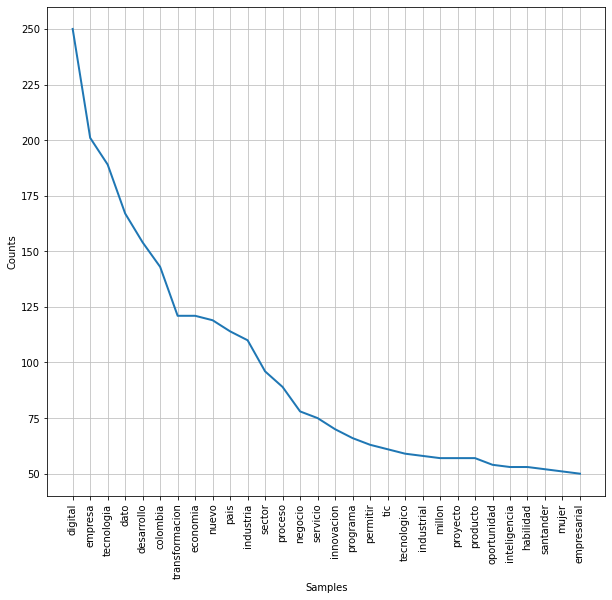

In [30]:
figura = plt.figure(figsize=(10,9), edgecolor = "red")

fdist.plot(30, cumulative=False)
figura.savefig("Palabras más frecuentes noticias" + ".png")
plt.show()


### TF-IDF

In [31]:
tf_idf_list = []
for words in final_list:
    tf_idf_list.append(' '.join(words))
    
len(tf_idf_list)

50

In [32]:
from sklearn.feature_extraction.text import TfidfVectorizer
      
def vectorizers(text, vectorizer):
    doc_matrix = vectorizer.fit_transform(text)
    return pd.DataFrame(doc_matrix.toarray(), columns = vectorizer.get_feature_names())

In [33]:
vector =  TfidfVectorizer(stop_words = stop_words, norm = "l1")

In [34]:
import warnings
warnings.filterwarnings("ignore")
data_fin = vectorizers(tf_idf_list, vector)
data_fin

abastecimiento   abierto   abogado  abordaje   abordar     abrio  \
0         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
1         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
3         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
4         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
5         0.000000  0.000000  0.000000  0.000000  0.000000  0.012172   
6         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
7         0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
8         0.000000  0.009420  0.000000  0.000000  0.000000  0.000000   
9         0.000000  0.007796  0.000000  0.000000  0.000000  0.000000   
10        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
11        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
12        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
13        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
14        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
15        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
16        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
17        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
18        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
19        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
20        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
21        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
22        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
23        0.000000  0.000000  0.000000  0.000000  0.031814  0.000000   
24        0.000000  0.005871  0.000000  0.000000  0.000000  0.000000   
25        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
26        0.000000  0.005255  0.000000  0.000000  0.000000  0.000000   
27        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
28        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
29        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
30        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
31        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
32        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
33        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
34        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
35        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
36        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
37        0.000000  0.000000  0.004552  0.000000  0.000000  0.000000   
38        0.000000  0.000000  0.000000  0.004112  0.000000  0.000000   
39        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
40        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
41        0.003545  0.000000  0.000000  0.000000  0.000000  0.000000   
42        0.000000  0.006842  0.000000  0.000000  0.000000  0.000000   
43        0.000000  0.000000  0.003090  0.000000  0.000000  0.000000   
44        0.000000  0.000000  0.000000  0.000000  0.003149  0.000000   
45        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
46        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
47        0.000000  0.000000  0.000000  0.000000  0.005147  0.000000   
48        0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
49        0.000956  0.000000  0.000000  0.000000  0.000000  0.000000   

       abrir  abudinar  abudinen    acabar  academia  academico   acceder  \
0   0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000   
1   0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000   
2   0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000   
3   0.000000  0.000000 

In [35]:
print(vector.get_feature_names())

['abastecimiento', 'abierto', 'abogado', 'abordaje', 'abordar', 'abrio', 'abrir', 'abudinar', 'abudinen', 'acabar', 'academia', 'academico', 'acceder', 'accesar', 'accesibilidad', 'accesible', 'acceso', 'accion', 'accionista', 'aceleracion', 'acelerado', 'acelerador', 'aceleradora', 'acelerakit', 'acelerar', 'acelero', 'acercar', 'acierto', 'aclarar', 'acompañamiento', 'acompañar', 'acondicionado', 'aconsejar', 'acorde', 'acostumbrado', 'acreditar', 'actividad', 'activo', 'actor', 'actriz', 'actual', 'actualidad', 'actualizar', 'actualizate', 'actuar', 'adaptabilidad', 'adaptacion', 'adaptar', 'adaptativo', 'adecuado', 'adelanto', 'adicional', 'adicionar', 'aditivo', 'adjudicar', 'adjunto', 'administracion', 'administrado', 'administrador', 'administrar', 'administrativo', 'adobe', 'adolescente', 'adopcion', 'adoptante', 'adoptar', 'adopter', 'adquirido', 'adquirir', 'adquisicion', 'adscrito', 'adulto', 'adversidad', 'advertir', 'aeroespacial', 'aeronautico', 'afectar', 'afecto', 'afia

### Reducción de dimensiones (PCA)

In [36]:
import numpy as np
from sklearn.decomposition import PCA
pca = PCA(0.8)
principal_components = pca.fit_transform(data_fin)

In [37]:
newdata = pd.DataFrame(data = principal_components, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8','PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19', 'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26', 'PC27', 'PC28', 'PC29', 'PC30', 'PC31'])
newdata

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31
0,-0.007703,-0.026258,-0.043154,0.057096,0.014181,0.022439,-0.001493,0.014488,-0.003152,-0.000781,0.004565,0.011349,0.009732,0.010395,0.003786,0.004031,-0.009808,-0.006801,-0.010765,-0.013645,0.015657,0.000594,0.007224,0.002146,0.004299,-0.017348,0.002091,0.019643,-0.009190,-0.006744,0.020621
1,0.001223,-0.009529,0.008975,-0.018251,0.071301,-0.018176,-0.010294,0.012956,0.011867,-0.019631,0.008295,-0.002814,-0.007257,-0.004928,0.003271,0.008039,-0.011257,0.003229,0.003981,-0.005132,-0.000454,-0.002767,-0.004006,0.008751,0.000375,-0.001426,0.007128,-0.004457,-0.001782,-0.002961,-0.003896
2,-0.003774,0.001667,0.014279,-0.033260,0.005154,0.049207,0.026408,-0.008660,-0.026006,-0.038692,-0.028718,-0.015991,0.053191,-0.016725,-0.015710,-0.025359,-0.005756,0.004546,0.017014,-0.006635,0.010920,-0.004975,0.009502,-0.001566,-0.002473,-0.013329,0.016786,0.003414,-0.003678,0.002609,-0.007119
3,0.006199,-0.017310,-0.008586,0.003709,-0.006611,-0.027840,0.051835,-0.012361,-0.011546,0.024565,0.026195,-0.043938,-0.017170,0.001688,-0.024667,-0.001094,-0.015314,0.038989,-0.018585,-0.026436,0.008484,0.004031,0.004039,0.010046,-0.005241,-0.011016,0.007491,0.003443,-0.018451,-0.004230,-0.006244
4,-0.013401,-0.006405,0.009966,0.004543,0.015569,-0.015993,-0.021360,-0.040872,-0.023804,0.009383,-0.006961,0.015827,0.027735,0.017233,-0.002471,0.003533,0.008154,0.035295,-0.028751,0.028045,0.018368,0.006042,0.005233,-0.013175,-0.000110,-0.021146,-0.017519,-0.000754,0.025179,-0.001409,0.018431
5,-0.004667,-0.024948,-0.035906,0.046274,0.001828,0.027745,-0.009002,0.012242,-0.001698,-0.011382,0.006640,0.012463,-0.009193,0.019620,-0.018924,-0.006979,-0.010458,-0.018630,-0.001309,-0.012342,0.010315,-0.021010,0.018599,0.023958,-0.000597,-0.004986,0.002660,-0.008884,0.023551,0.005714,-0.007599
6,-0.000456,-0.010057,0.000061,0.001638,-0.000040,-0.007294,-0.013387,0.002630,-0.021719,0.005333,-0.008954,0.001926,-0.004324,-0.030374,-0.012697,-0.018158,0.002852,-0.001415,-0.007917,-0.007822,-0.002997,0.023673,0.007693,0.016898,0.054176,0.017982,-0.011687,0.001585,-0.004004,0.003242,0.000919
7,-0.054251,0.082944,-0.028936,-0.007840,0.002772,-0.021265,0.011924,-0.005299,-0.009560,0.000653,0.009803,0.022324,0.022631,0.022016,0.019399,0.000562,0.005946,0.002527,-0.002899,-0.007869,-0.015394,-0.008294,0.002524,0.034345,0.008520,-0.002704,0.010729,-0.010089,-0.011763,-0.006218,-0.003536
8,0.023814,-0.017588,-0.027937,-0.038821,-0.007067,-0.021639,0.005794,0.059140,-0.029550,0.021062,-0.001387,0.017632,0.004612,-0.003869,-0.001293,0.008627,0.032689,0.004003,0.001643,0.014057,0.024888,-0.020244,0.000898,0.006036,-0.014161,-0.001532,-0.008560,0.001042,0.002653,0.010949,-0.014324
9,-0.004859,-0.014461,-0.001118,0.005461,0.002800,-0.016885,-0.022702,-0.015782,0.000719,-0.002365,-0.014363,0.005219,-0.004483,0.003923,-0.011597,-0.022087,0.039556,-0.014150,-0.006736,-0.030813,-0.004306,-0.006765,-0.007921,-0.023138,-0.010279,-0.018657,-0.010836,-0.032526,-0.028490,-0.013612,-0.000734


In [38]:
print(data_fin.shape)
print(newdata.shape)

(50, 1804)
(50, 31)


In [39]:
per_var = np.round(pca.explained_variance_ratio_ *100, decimals = 1)
label_2 =['PC' + str(x) for x in range(1, len(per_var) + 1)] 

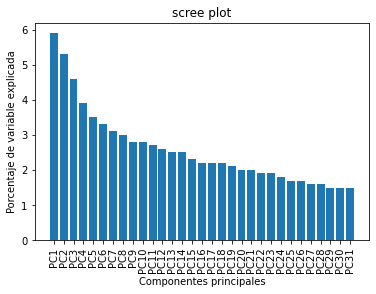

In [40]:
plt.bar(x = range(1, len(per_var)+1), height = per_var, tick_label = label_2)
plt.ylabel('Porcentaje de variable explicada')
plt.xlabel('Componentes principales')
plt.xticks(rotation=90)
plt.title('scree plot')
plt.show()

### Clusterización - KMeans

In [122]:
from sklearn.cluster import KMeans
import sklearn.cluster as cluster

K=range(1,51)
wss = []
for k in K:
    kmeans=cluster.KMeans(n_clusters=k,init="k-means++")
    kmeans=kmeans.fit(newdata) #data_fin
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)

In [123]:
mycenters = pd.DataFrame({'Clusters' : K, 'WSS' : wss})
mycenters

,Clusters,WSS
0,1,0.397931
1,2,0.372289
2,3,0.356415
3,4,0.335938
4,5,0.320596
5,6,0.310508
6,7,0.299754
7,8,0.273272
8,9,0.266026
9,10,0.254182


In [125]:
wss


[0.39793066456658677,
 0.3722887654460674,
 0.35641450189084756,
 0.3359376348676986,
 0.32059610533260774,
 0.31050751514727415,
 0.299753911064539,
 0.27327241878280817,
 0.2660262140713772,
 0.2541820608862811,
 0.2386690929742674,
 0.22669542150481736,
 0.21404510176908323,
 0.20376773920515145,
 0.19491565390819804,
 0.18205327036542493,
 0.171845941170551,
 0.1605964150989031,
 0.1478287864669,
 0.14364612180850095,
 0.12866899778512747,
 0.12096162459391063,
 0.11188717820628459,
 0.1023839895898103,
 0.0936300293103222,
 0.08650194158159613,
 0.07858630507423497,
 0.06854751224875183,
 0.06454944331435028,
 0.05627526930142822,
 0.05081528506111651,
 0.043241440474623354,
 0.04028184134647932,
 0.0328500885216511,
 0.02922747940148605,
 0.023913505743669093,
 0.019955372351199995,
 0.016863282350037305,
 0.0141068412370467,
 0.01179062608995066,
 0.009178576390909512,
 0.007473130699115022,
 0.005608831539903218,
 0.004332522396058082,
 0.0034268745291171163,
 0.002572373287898

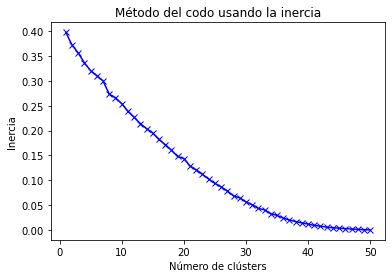

In [127]:
plt.plot(K, wss, 'bx-')
plt.xlabel("Número de clústers")
plt.ylabel("Inercia")
plt.title("Método del codo usando la inercia")
#plt.savefig("Método del codo noticias.png")
plt.show()

In [138]:
true_k = 8 # Número final de clúster 18, 24
model = KMeans(n_clusters=true_k, init='k-means++')
model.fit(newdata) #data_fin
labels = model.labels_
table = pd.DataFrame(list(zip(urls,labels)),columns=['title','cluster'])
print(table.sort_values(by=['cluster']))

                                                title  cluster
20  https://mintic.gov.co/portal/inicio/Sala-de-pr...        0
8   https://www.elnuevosiglo.com.co/articulos/07-0...        0
35  https://incp.org.co/mintic-apoyara-la-transfor...        0
16  https://www.portafolio.co/innovacion/colombia-...        1
22  https://www.eltiempo.com/tecnosfera/novedades-...        1
23  https://www.vanguardia.com/informes-comerciale...        2
48  https://www.bloomberglinea.com/2021/11/22/colo...        2
31  https://es.investinbogota.org/noticias/coyuntu...        2
32  https://www.portafolio.co/innovacion/colombia-...        2
33  https://carrerasuniversitarias.com.co/fundacio...        2
34  https://mintic.gov.co/portal/inicio/Sala-de-pr...        2
24  https://www.larepublica.co/economia/ministerio...        2
38  https://www.colombiaproductiva.com/ptp-comunic...        2
41  https://www.portafolio.co/contenido-patrocinad...        2
42  https://www.semana.com/contenidos-editoriales/...  

### Nube de Palabras

In [139]:
from wordcloud import WordCloud

datos = {'cluster':labels,'content':tf_idf_list}
df = pd.DataFrame.from_dict(datos, orient='index')
df = df.transpose()
df

,cluster,content
0,6,este año en su undecimo version el evento de c...
1,2,p a el menos empresa de el pais entre él uno s...
2,2,p desde el gobierno municipal él avanzar para ...
3,3,caf informar que prestar us a colombia para ac...
4,2,i tener uno camino largo que recorrer pero ir ...
5,6,de uno exitoso jornada en el atlantico con mas...
6,2,hablar de el industria ser hablar de digitaliz...
7,5,sp el mas reciente estudio de compañia especia...
8,0,el tenencia y el uso estrategico de el tecnolo...
9,2,p asumir rapidamente el transformacion digital...


Cluster: 0
Titles
https://www.elnuevosiglo.com.co/articulos/07-09...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://incp.org.co/mintic-apoyara-la-transform...


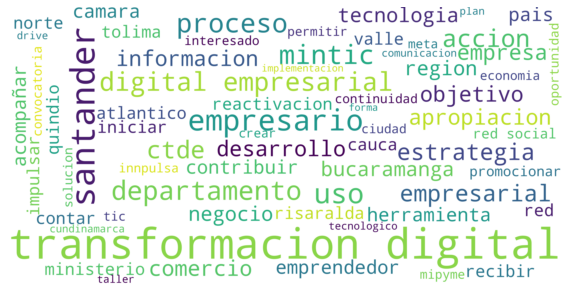

Cluster: 1
Titles
https://www.portafolio.co/innovacion/colombia-b...
https://www.eltiempo.com/tecnosfera/novedades-t...


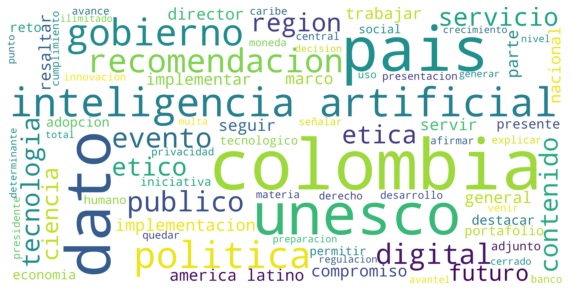

Cluster: 2
Titles
https://www.vanguardia.com/economia/local/empre...
https://www.bucaramanga.gov.co/noticias/bucaram...
https://www.semana.com/nacion/articulo/colombia...
https://www.bancolombia.com/negocios/actualizat...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://redmas.com.co/w/alianza-de-claro-colomb...
https://www.funcionpublica.gov.co/-/-c2-a0el-pa...
https://www.portafolio.co/innovacion/empresas-t...
https://www.rcnradio.com/economia/para-que-colo...
https://www.vanguardia.com/informes-comerciales...
https://www.larepublica.co/economia/ministerio-...
https://es.investinbogota.org/noticias/coyuntur...
https://www.portafolio.co/innovacion/colombia-c...
https://carrerasuniversitarias.com.co/fundacion...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://www.portafolio.co/innovacion/colombia-4...
https://www.colombiaproductiva.com/ptp-comunica...
https://www.portafolio.co/contenido-patrocinado...
https://www.s

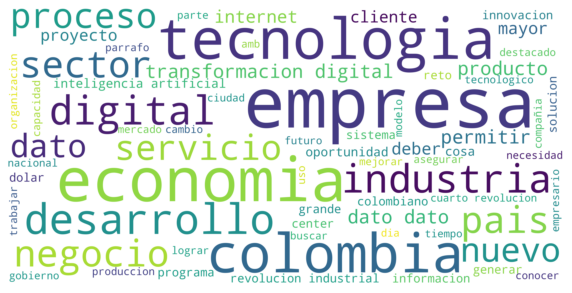

Cluster: 3
Titles
https://www.elespectador.com/economia/caf-aprob...
https://www.mintic.gov.co/portal/inicio/Sala-de...
http://ingenieria.redmutis.org.co/es/actualidad...
https://www.laopinion.com.co/sectores-empresari...
https://www.laopinion.com.co/economia/cuales-so...
https://www.portafolio.co/economia/empleo/habil...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://www.larepublica.co/finanzas/en-colombia...
https://www.sena.edu.co/es-co/Noticias/Paginas/...
https://www.eltiempo.com/contenido-comercial/mi...


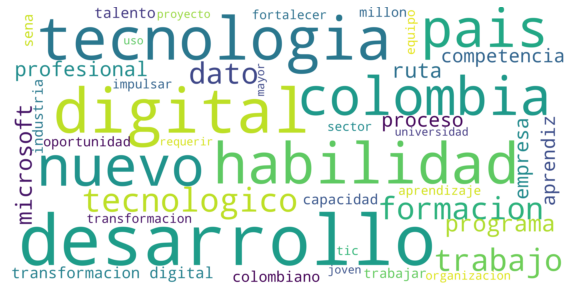

Cluster: 4
Titles
https://www.colombiaproductiva.com/ptp-comunica...
   https://www.intersoftware.org.co/cl%C3%BAster40


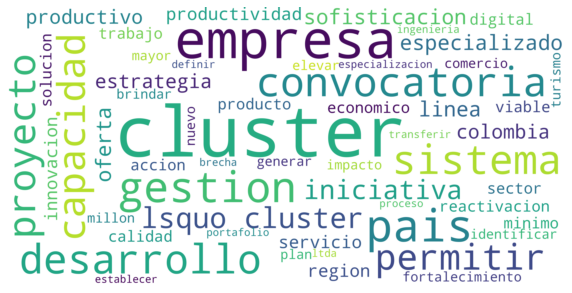

Cluster: 5
Titles
https://www.semana.com/tecnologia/articulo/muje...
https://www.larepublica.co/analisis/fabiano-mat...
https://www.usergioarboleda.edu.co/noticias/muj...


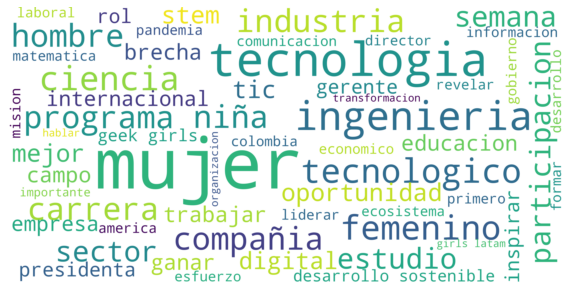

Cluster: 6
Titles
https://www.mintic.gov.co/portal/inicio/Sala-de...
https://www.mintic.gov.co/portal/inicio/Sala-de...


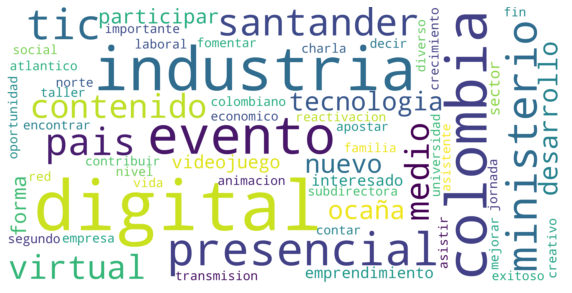

Cluster: 7
Titles
https://minciencias.gov.co/sala_de_prensa/15-em...
https://minciencias.gov.co/sala_de_prensa/26-em...


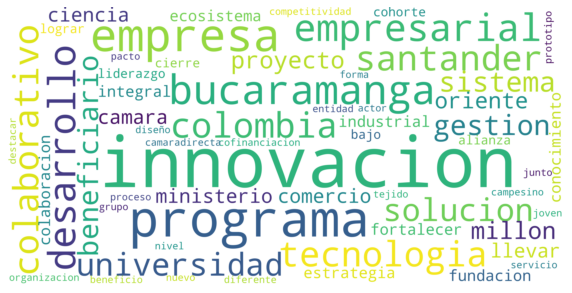

In [141]:
realclust = 8
for k in range(0,realclust):
    s = df[df.cluster==k]
    Text = s['content'].str.cat(sep=' ')
    Text = Text.lower()
    Text=' '.join([word for word in Text.split()])
    wordcloud = WordCloud(min_font_size = 13, max_font_size=100, max_words=100, background_color="white",scale=10, width=800, height=400,stopwords = stop_words).generate(Text)
    print('Cluster: {}'.format(k))
    print('Titles')
    titles = table[table.cluster==k]['title']
    print(titles.to_string(index=False))
    plt.figure(figsize=(10,7))
    plt.imshow(wordcloud, interpolation="bilinear", cmap="PuBuGn")
    plt.axis("off")
    #plt.savefig("cluster noticias " + str(k) +".png", dpi=500)
    plt.show()

### Gráfico de barras

Gráfico de barras: 0
Titles
https://www.elnuevosiglo.com.co/articulos/07-09...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://incp.org.co/mintic-apoyara-la-transform...


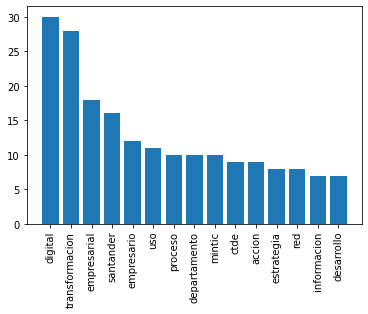

<Figure size 720x720 with 0 Axes>

Gráfico de barras: 1
Titles
https://www.portafolio.co/innovacion/colombia-b...
https://www.eltiempo.com/tecnosfera/novedades-t...


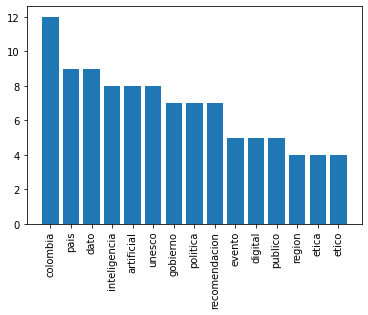

<Figure size 720x720 with 0 Axes>

Gráfico de barras: 2
Titles
https://www.vanguardia.com/economia/local/empre...
https://www.bucaramanga.gov.co/noticias/bucaram...
https://www.semana.com/nacion/articulo/colombia...
https://www.bancolombia.com/negocios/actualizat...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://redmas.com.co/w/alianza-de-claro-colomb...
https://www.funcionpublica.gov.co/-/-c2-a0el-pa...
https://www.portafolio.co/innovacion/empresas-t...
https://www.rcnradio.com/economia/para-que-colo...
https://www.vanguardia.com/informes-comerciales...
https://www.larepublica.co/economia/ministerio-...
https://es.investinbogota.org/noticias/coyuntur...
https://www.portafolio.co/innovacion/colombia-c...
https://carrerasuniversitarias.com.co/fundacion...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://www.portafolio.co/innovacion/colombia-4...
https://www.colombiaproductiva.com/ptp-comunica...
https://www.portafolio.co/contenido-patrocinado...
htt

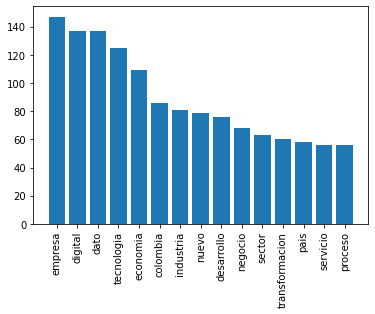

<Figure size 720x720 with 0 Axes>

Gráfico de barras: 3
Titles
https://www.elespectador.com/economia/caf-aprob...
https://www.mintic.gov.co/portal/inicio/Sala-de...
http://ingenieria.redmutis.org.co/es/actualidad...
https://www.laopinion.com.co/sectores-empresari...
https://www.laopinion.com.co/economia/cuales-so...
https://www.portafolio.co/economia/empleo/habil...
https://mintic.gov.co/portal/inicio/Sala-de-pre...
https://www.larepublica.co/finanzas/en-colombia...
https://www.sena.edu.co/es-co/Noticias/Paginas/...
https://www.eltiempo.com/contenido-comercial/mi...


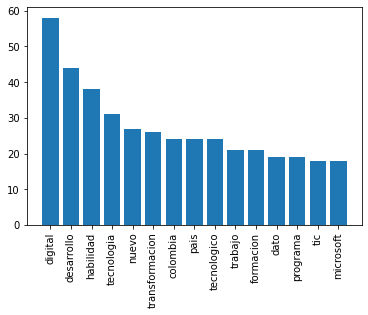

<Figure size 720x720 with 0 Axes>

Gráfico de barras: 4
Titles
https://www.colombiaproductiva.com/ptp-comunica...
   https://www.intersoftware.org.co/cl%C3%BAster40


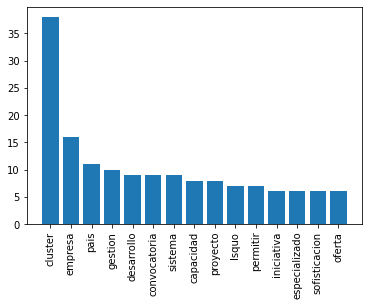

<Figure size 720x720 with 0 Axes>

Gráfico de barras: 5
Titles
https://www.semana.com/tecnologia/articulo/muje...
https://www.larepublica.co/analisis/fabiano-mat...
https://www.usergioarboleda.edu.co/noticias/muj...


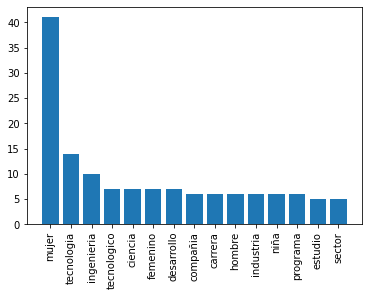

<Figure size 720x720 with 0 Axes>

Gráfico de barras: 6
Titles
https://www.mintic.gov.co/portal/inicio/Sala-de...
https://www.mintic.gov.co/portal/inicio/Sala-de...


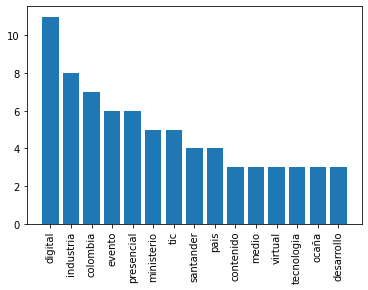

<Figure size 720x720 with 0 Axes>

Gráfico de barras: 7
Titles
https://minciencias.gov.co/sala_de_prensa/15-em...
https://minciencias.gov.co/sala_de_prensa/26-em...


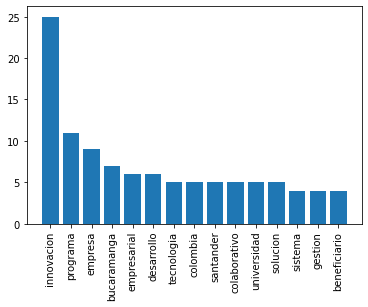

<Figure size 720x720 with 0 Axes>

In [142]:
from collections import Counter
import operator
import itertools 


for w in range(0,realclust):
    cont = df[df.cluster==w]
    New_Text = cont['content'].str.cat(sep=' ')
    New_Text =  New_Text.lower()
    New_Text = nltk.word_tokenize(New_Text)
    New_Text = [word for word in New_Text if not word in stop_words]
    print('Gráfico de barras: {}'.format(w))
    print('Titles')
    titles = table[table.cluster==w]['title']
    print(titles.to_string(index=False))
    common_words =  Counter(New_Text).most_common(15)
    dataf = pd.DataFrame(data = common_words)
    plt.bar(dataf[0], height=dataf[1])
    plt.xticks(rotation=90)
    plt.figure(figsize = (10,10))
    plt.show()
    
    